                                                                                                              Kelvin_Project
# PO Lazada x ULI Analysis

## Robotic Process Automation Project from PO Draft Lazada to Unilever

## MANUAL ACTION INSTRUCTIONS

1. If any update of pricelist & product hierarchy, should be update on Master Data.xlsx with sheet "Pricelist" from pricelist all category MT latest (file from Admin Ecomm) and sheet "Product Hierarchy" from latest Product Hierarchy according to COLUMN RULES
2. Delete the topmost/header column (number) on excel downloader from spreadsheet file Lazada (Unilever Catalog).xlsx so that the header is a column name for column mapping in the program -> REQUIRED. It can also delete all sheets except 'Updated Pricelist (LAZ SKU UPDA ' to reduce file size -> OPTIONAL then upload to file directory program as name Lazada (Unilever Catalog).xlsx
3. Update ANDROMEDA.xlsb day/day
4. Latest PC Mapping.xlsx update (not PC Mapping from S&OP) but PC Mapping file from Admin Ecomm -> MAKE SURE FILE PC MAPPING IS UP TO DATE AND NO ISSUES ON NEW MATERIAL MAPPING !
5. Update PODetail_Lazada.xlsx from portal web ASCP LAZADA
6. Rename output files according to processing date on toolbars "Edit -> Find and Replace", ex : 20D1_Final PO Lazada - ULI.xlsx
7. Run program on Toolbars "Kernel" then "Restart & Run All"
8. Wait until process is done then "Download FIle"

IMPORTANT REMARK :

DO NOT CHANGE, REPLACE OR DELETE ANY FUNCTION IN THIS WORKSHEET CODE WITHOUT CONSENT, IF ANY ERROR PLEASE DISCUSS !

In [1]:
import pandas as pd
import openpyxl
from openpyxl import load_workbook
from openpyxl.drawing.image import Image
from IPython.display import FileLink
import warnings
import numpy as np
import matplotlib.pyplot as plt
warnings.simplefilter("ignore")
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [2]:
#deldata and update after processing [FINISH LATER] -> done

In [3]:
delData = openpyxl.load_workbook('PO Lazada x ULI Template Processing.xlsx')

In [4]:
sheetPricelistULI = delData['Pricelist']
delData.remove(sheetPricelistULI)

In [5]:
sheetPH = delData['Product Hierarchy']
delData.remove(sheetPH)

In [6]:
sheetPO = delData['SKU List of Purchase Order For ']
delData.remove(sheetPO)

In [7]:
sheetPricelistLAZ = delData['Updated Pricelist (LAZ SKU UPDA']
delData.remove(sheetPricelistLAZ)

In [8]:
sheetPC = delData['PC Mapping']
delData.remove(sheetPC)

In [9]:
sheetStock = delData['ANDROMEDA']
delData.remove(sheetStock)

In [10]:
sheetProses = 'proses'
if sheetProses in delData.sheetnames:
    delData.remove(delData[sheetProses])

In [11]:
delData.save('PO Lazada x ULI Template Processing.xlsx')

In [12]:
#define master data (PRICELIST ULI & PRODUCT HIERARCHY)

In [13]:
file_MasterData = 'Master Data.xlsx'

In [14]:
PricelistULI = pd.read_excel(file_MasterData, sheet_name='Pricelist')

In [15]:
with pd.ExcelWriter('PO Lazada x ULI Template Processing.xlsx', mode='a', engine='openpyxl') as writer:
    PricelistULI.to_excel(writer, sheet_name='Pricelist', index=False)

In [16]:
ProductHierarchy = pd.read_excel(file_MasterData, sheet_name='Product Hierarchy')

In [17]:
with pd.ExcelWriter('PO Lazada x ULI Template Processing.xlsx', mode='a', engine='openpyxl') as writer:
    ProductHierarchy.to_excel(writer, sheet_name='Product Hierarchy', index=False)

In [18]:
#define PO Detail LAZADA

In [19]:
POdetail = pd.read_excel('PODetail_Lazada.xlsx', sheet_name='SKU List of Purchase Order For ')

In [20]:
POdetail.head()

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Buying Quantity,Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Negotiated Price,Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Cost Exclude VAT,VAT,Total Cost Include VAT
0,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06
1,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06
2,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06
3,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,68818383,1332,NaN,NaN,0,0,55603.687,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,7.406411e+07,11.0000%,8.221116e+07
4,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,68187726,192,NaN,NaN,0,0,25590.996,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4.913471e+06,11.0000%,5.453953e+06


In [21]:
POdetail = POdetail.rename(columns={'Buying Quantity': 'Lazada Order Qty (Laz pcs)', 'Negotiated Price':  'Lazada Price (pcs)', 'Total Cost Exclude VAT': 'Total Value Lazada (excl VAT)', 'Total Cost Include VAT': 'Total Value Lazada (incl VAT)'})

In [22]:
with pd.ExcelWriter('PO Lazada x ULI Template Processing.xlsx', mode='a', engine='openpyxl') as writer:
    POdetail.to_excel(writer, sheet_name='SKU List of Purchase Order For ', index=False)

In [23]:
#define laz ecatalogue

In [24]:
Laz_ecatalog = pd.read_excel('Lazada (Unilever Catalog).xlsx', sheet_name='Updated Pricelist (LAZ SKU UPDA')

In [25]:
with pd.ExcelWriter('PO Lazada x ULI Template Processing.xlsx', mode='a', engine='openpyxl') as writer:
    Laz_ecatalog.to_excel(writer, sheet_name='Updated Pricelist (LAZ SKU UPDA', index=False)

In [26]:
#define PC mapping

In [27]:
PC_Mapping = pd.read_excel('PC Mapping.xlsx', sheet_name='PC Mapping')

In [28]:
PC_Mapping.head()

,Old Material,Old Description,Old Barcode,New Material,New Description,New Barcode,Remarks,Asset Ready,Price Ready,Stock Availbility,Update,Recovery,GDRIVE,Unnamed: 13
0,67153619,ZWITSAL SHP AVKS+HAIR LOT 36X(100+90)ML,8992694246340,21023193,ZWITSAL BABY SHAMPOO NAT AVKS 6X6X100ML,8992694246340,x,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,67093743,ZWITSAL SHP AVKS+HAIR LOT 36X(100+50)ML,8992694246340,21023193,ZWITSAL BABY SHAMPOO NAT AVKS 6X6X100ML,8992694246340,x,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,67306807,ZWITSAL SHP AVKS+ BARSOAP 36X(100ML+80G),8992694246340,21023193,ZWITSAL BABY SHAMPOO NAT AVKS 6X6X100ML,8992694246340,x,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,67055098,ZWITSAL PWD SF FLORAL 12X360G,8999999057824,60024446,ZWITSAL BB PWD CLSC SOFT FLO 12X300G,8992694244056,Downfill - Change Barcode,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,67055100,ZWITSAL PWD MLK&HON 12X360G,8999999057831,67494038,ZWITSAL BB NAT RICH HON PWD 12X300GR,8992694244513,Downfill - Change Barcode,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
with pd.ExcelWriter('PO Lazada x ULI Template Processing.xlsx', mode='a', engine='openpyxl') as writer:
    PC_Mapping.to_excel(writer, sheet_name='PC Mapping', index=False)

In [30]:
#define andromeda

In [31]:
stock = pd.read_excel('ANDROMEDA.xlsb', sheet_name = 'Sheet1', engine='pyxlsb')

In [32]:
stock['uniquecode'] = stock[['Material', 'Plant']].apply(lambda x: ''.join(x.dropna().astype(str)), axis=1)

In [33]:
#Move Unicode Column to Left

In [34]:
move_uniquecode = stock.pop(stock.columns[-1]) #get data unicode

In [35]:
stock.insert(0, move_uniquecode.name, move_uniquecode) #paste data into left column

In [36]:
stock.head()

,uniquecode,IABBT,LT,Rank,EX,Class,Min IPM,Avg IPM,Max IPM,Activity,Core / Non Core,Core MT,Material,Description,Plant,Stor Location,lDesc,UU Stk,Safety Stk,Available,PA,QI Stock,IT,IT This wk,IT Next wk,IT Two wk,STO Out,STO In,PSO,OTSD PSO,FNL SO,OSTD SO,FNL MT,OSTD MT,FNL GT,OSTD GT,RR_SO 13WK,RR_ACT 13 WK,RR_SO 5WK,RR_ACT 5WK,F WK1,F WK2,F WK3,F WK4,F WK5,SNP PLANNER,AVG FORECAST,LOC Type,SUB CATEGORY,Blocked,WC BY RR,WC BY FORECAST,SAFETY RF,Dispatching flag,Boughtin MDC flag,Category Mix,Sub Division 2 Mix
0,200611659208,Z2,16,0,SBY,NaN,0.0,0.0,0.0,0,0,0,20061165,LIFEBUOY TS RED TTPR MP 24X(4X115G),9208,9701,DC MEDAN,0.0,0,0.0,0,0.0,65.0,65.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SKIN CLEANSING PW BAR,0.0,D,SKIN CLEANSING,0.0,0.0,0.0,0.0,X,NaN,SKIN CLEANSING PW BAR,PERSONAL CARE
1,200611689101,Z2,0,0,JKT,NaN,0.0,0.0,0.0,0,0,0,20061168,MOLTO ULTRA SB GREEN REF 12X900ML,9101,9888,Home Care Overflow,0.0,0,-7.0,0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,FABRIC ENHANCERS,0.0,D,FABRIC ENHANCERS,0.0,0.0,0.0,0.0,NaN,NaN,FABRIC ENHANCERS,HOME CARE
2,200611709101,Z2,0,0,JKT,NaN,0.0,0.0,0.0,0,0,0,20061170,MOLTO ULTRA SB BLUE REF 12X900ML,9101,9888,Home Care Overflow,0.0,0,-3.0,0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,FABRIC ENHANCERS,0.0,D,FABRIC ENHANCERS,0.0,0.0,0.0,0.0,NaN,NaN,FABRIC ENHANCERS,HOME CARE
3,200617799003,Z2,0,0,JKT,NaN,0.0,0.0,0.0,0,0,0,20061779,LIFEBUOY BW GREEN REF 24X250ML,9003,9005,SKIN-BOF Local,0.0,0,0.0,0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SKIN CLEANSING PW LIQUID,0.0,F,SKIN CLEANSING,0.0,0.0,0.0,0.0,NaN,NaN,SKIN CLEANSING PW LIQUID,PERSONAL CARE
4,200618539150,Z2,1,0,JKT,NaN,0.0,0.0,0.0,0,0,0,20061853,LIFEBUOY BW BLUE BTL 36X100ML,9150,9901,MDC West,0.0,0,0.0,0,0.0,3.0,3.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SKIN CLEANSING PW LIQUID,0.0,M,SKIN CLEANSING,0.0,0.0,0.0,0.0,X,NaN,SKIN CLEANSING PW LIQUID,PERSONAL CARE


In [37]:
with pd.ExcelWriter('PO Lazada x ULI Template Processing.xlsx', mode='a', engine='openpyxl') as writer:
    stock.to_excel(writer, sheet_name='ANDROMEDA', index=False)

In [38]:
#column pc code & multiplier

In [39]:
file_processing = 'PO Lazada x ULI Template Processing.xlsx'

In [40]:
df = pd.read_excel(file_processing, sheet_name='SKU List of Purchase Order For ')

In [41]:
#merger & pisah per bundle

In [42]:
df_PC = pd.read_excel(file_processing, sheet_name='Updated Pricelist (LAZ SKU UPDA', usecols=['SKU', 'PC Code', 'Multiplier', 'pc1', 'qty1', 'pc2', 'qty2', 'pc3', 'qty3', 'pc4', 'qty4'])

In [43]:
df = pd.merge(left=df, right=df_PC, how='left', left_on='Sku', right_on='SKU')

In [44]:
df = df.drop(columns=['SKU'])

In [45]:
df

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,pc1,qty1,pc2,qty2,pc3,qty3,pc4,qty4,Multiplier
0,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,68884803,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1
1,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,67943928,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1
2,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,67883800,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1
3,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,68818383,1332,NaN,NaN,0,0,55603.687,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,7.406411e+07,11.0000%,8.221116e+07,68818383,68818383,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1
4,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,68187726,192,NaN,NaN,0,0,25590.996,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4.913471e+06,11.0000%,5.453953e+06,68187726,68187726,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1
5,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,4908726974_ID-9040154031,Citra Volcanic Clay Body Scrub 100ml,68376048,36,NaN,NaN,0,0,14438.554,PENDING,Citra,Body Scrubs,NaN,NaN,NaN,5.197879e+05,11.0000%,5.769646e+05,68376048,68376048,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1
6,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,4581192955_ID-7927614774,Lux Botanicals Bodywash Soft Rose Reff 825Ml,68410800,420,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,1.452400e+07,11.0000%,1.612164e+07,68884802,68884802,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1
7,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Wareho

In [46]:
#!!!!!

In [47]:
if df['PC Code'].astype(str).str.contains('-', na=False).any():
    # Membuat DataFrame baru untuk data bundle
    df_bundle = df[df['PC Code'].astype(str).str.contains('-', na=False)].copy()
    df_bundle['PC Code'] = df_bundle['PC Code'].astype(str)

    
    
    # Delete data bundle dari DataFrame asli
    df = df[~df['PC Code'].astype(str).str.contains('-', na=False)].copy()

In [48]:
if 'df_bundle' in locals():
    display(df_bundle)

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,pc1,qty1,pc2,qty2,pc3,qty3,pc4,qty4,Multiplier
261,ID,IDP0747314,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-06-22 11:51:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:54,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,132,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,6756022.944,11.0000%,7.499185e+06,68187724-68187726,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1
262,ID,IDP0747313,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-07-03 11:51:54,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:53,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,24,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,1228367.808,11.0000%,1.363488e+06,68187724-68187726,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1
263,ID,IDP0747311,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-06-22 11:51:51,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:51,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,96,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4913471.232,11.0000%,5.453953e+06,68187724-68187726,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1


In [49]:
#pisahkan bundle ke baris baru untuk masing masing PC code -> DONE

In [50]:
if 'df_bundle' in locals():
    df_bundle['PC Code'] = df_bundle['PC Code'].astype(str)

In [51]:
if 'df_bundle' in locals():
    df_bundle['PC Code Original'] = df_bundle['PC Code']

In [52]:
if 'df_bundle' in locals():
    display(df_bundle)

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,pc1,qty1,pc2,qty2,pc3,qty3,pc4,qty4,Multiplier,PC Code Original
261,ID,IDP0747314,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-06-22 11:51:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:54,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,132,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,6756022.944,11.0000%,7.499185e+06,68187724-68187726,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1,68187724-68187726
262,ID,IDP0747313,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-07-03 11:51:54,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:53,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,24,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,1228367.808,11.0000%,1.363488e+06,68187724-68187726,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1,68187724-68187726
263,ID,IDP0747311,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-06-22 11:51:51,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:51,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,96,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4913471.232,11.0000%,5.453953e+06,68187724-68187726,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1,68187724-68187726


In [53]:
if 'df_bundle' in locals():
    df_bundle = (df_bundle.assign(PC_Code=df_bundle['PC Code'].str.split('-'))
                 .explode('PC Code')
                 .reset_index(drop=True))

In [54]:
if 'df_bundle' in locals():
    display(df_bundle)

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,pc1,qty1,pc2,qty2,pc3,qty3,pc4,qty4,Multiplier,PC Code Original,PC_Code
0,ID,IDP0747314,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-06-22 11:51:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:54,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,132,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,6756022.944,11.0000%,7.499185e+06,68187724-68187726,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1,68187724-68187726,"[68187724, 68187726]"
1,ID,IDP0747313,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-07-03 11:51:54,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:53,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,24,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,1228367.808,11.0000%,1.363488e+06,68187724-68187726,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1,68187724-68187726,"[68187724, 68187726]"
2,ID,IDP0747311,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-06-22 11:51:51,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:51,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,96,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4913471.232,11.0000%,5.453953e+06,68187724-68187726,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1,68187724-68187726,"[68187724, 68187726]"


In [55]:
if 'df_bundle' in locals():
    df_bundle = (df_bundle.set_index(['Country', 'Purchase Order Number', 'Supplier Name', 'Warehouse Name', 'Logistic Type', 'Logistic Method', 'Logistic Arrival Datetime', 
                                      'Supplier Contract Type', 'ExpiryDate', 'Payment Terms', 'Payment Type', 'Agreement Number', 'Note To Supplier', 'Currency', 'Supplier Address', 
                                      'Purchase Order Create Date', 'Buying Unit', 'Sku', 'Product Name', 'Seller SKU', 'Lazada Order Qty (Laz pcs)', 'Accept Buying Quantity', 
                                      'Receive Buying Quantity', 'Received Damaged Quantity', 'Received Expiry Quantity', 'Lazada Price (pcs)', 'Supplier Approval Status', 'Brand', 
                                      'Category', 'Color', 'Size', 'Retail Price', 'Total Value Lazada (excl VAT)', 'VAT', 'Total Value Lazada (incl VAT)','pc1','qty1','pc2','qty2','pc3','qty3','pc4', 'qty4', 'Multiplier', 'PC Code Original'], append=True)
                 ['PC Code']
                 .str.split('-', expand=True)
                 .stack()
                 .reset_index(level=0, drop=True)
                 .reset_index(name='PC Code'))

In [56]:
if 'df_bundle' in locals():
    display(df_bundle)

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),pc1,qty1,pc2,qty2,pc3,qty3,pc4,qty4,Multiplier,PC Code Original,level_45,PC Code
0,ID,IDP0747314,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-06-22 11:51:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:54,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,132,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,6756022.944,11.0000%,7.499185e+06,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1,68187724-68187726,0,68187724
1,ID,IDP0747314,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-06-22 11:51:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:54,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,132,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,6756022.944,11.0000%,7.499185e+06,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1,68187724-68187726,1,68187726
2,ID,IDP0747313,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-07-03 11:51:54,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:53,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,24,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,1228367.808,11.0000%,1.363488e+06,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1,68187724-68187726,0,68187724
3,ID,IDP0747313,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-07-03 11:51:54,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:53,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,24,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,1228367.808,11.0000%,1.363488e+06,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1,68187724-68187726,1,68187726
4,ID,IDP0747311,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-06-22 11:51:51,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:51,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,96,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4913471.232,11.0000%,5.453953e+06,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1,68187724-68187726,0,68187724
5,ID,IDP0747311,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-06-22 11:51:51,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:51,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,96,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4913471.232,11.0000%,5.453953e+06,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1,68187724-68187726,1,68187726


In [57]:
#mapping pc on qty then input on multiplier

In [58]:
if 'df_bundle' in locals():
    # Create an empty dictionary to store the mapping
    mapping_dict = {}

    # Iterate over each row in the DataFrame
    for index, row in df_bundle.iterrows():
        pc_code = row['PC Code']
        qty_columns = ['qty1', 'qty2', 'qty3', 'qty4']
        pc_columns = ['pc1', 'pc2', 'pc3', 'pc4']

        # Iterate over pc_columns and qty_columns simultaneously
        for pc_col, qty_col in zip(pc_columns, qty_columns):
            if pc_col in row and not pd.isna(row[pc_col]):
                sku_pc_code = f"{row[pc_col]}-{row['PC Code']}"
                if sku_pc_code not in mapping_dict:
                    mapping_dict[sku_pc_code] = row[qty_col]
                else:
                    mapping_dict[sku_pc_code] = max(mapping_dict[sku_pc_code], row[qty_col])

    # Update the Multiplier column based on the mapping
    df_bundle['Multiplier'] = df_bundle.apply(lambda row: mapping_dict.get(f"{row['pc1']}-{row['PC Code']}"), axis=1)


In [59]:
if 'df_bundle' in locals():
    display(df_bundle)
    
    #MULTIPLIER JADI 2? -> DONE MULTIPLIER BY QTY ON PC

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),pc1,qty1,pc2,qty2,pc3,qty3,pc4,qty4,Multiplier,PC Code Original,level_45,PC Code
0,ID,IDP0747314,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-06-22 11:51:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:54,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,132,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,6756022.944,11.0000%,7.499185e+06,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1.0,68187724-68187726,0,68187724
1,ID,IDP0747314,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-06-22 11:51:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:54,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,132,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,6756022.944,11.0000%,7.499185e+06,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1.0,68187724-68187726,1,68187726
2,ID,IDP0747313,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-07-03 11:51:54,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:53,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,24,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,1228367.808,11.0000%,1.363488e+06,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1.0,68187724-68187726,0,68187724
3,ID,IDP0747313,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-07-03 11:51:54,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:53,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,24,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,1228367.808,11.0000%,1.363488e+06,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1.0,68187724-68187726,1,68187726
4,ID,IDP0747311,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-06-22 11:51:51,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:51,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,96,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4913471.232,11.0000%,5.453953e+06,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1.0,68187724-68187726,0,68187724
5,ID,IDP0747311,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-06-22 11:51:51,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:51,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,96,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4913471.232,11.0000%,5.453953e+06,68187724,1.0,68187726,1.0,NaN,NaN,NaN,NaN,1.0,68187724-68187726,1,68187726


In [60]:
if 'df_bundle' in locals():
    df = pd.concat([df, df_bundle], ignore_index=True)

In [61]:
if all(col in df.columns for col in ['pc1', 'qty1', 'pc2', 'qty2', 'pc3', 'qty3', 'pc4', 'qty4']):
    df = df.drop(['pc1', 'qty1', 'pc2', 'qty2', 'pc3', 'qty3', 'pc4', 'qty4'], axis=1)

In [62]:
df

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45
0,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1,NaN,NaN
1,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1,NaN,NaN
2,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1,NaN,NaN
3,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,68818383,1332,NaN,NaN,0,0,55603.687,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,7.406411e+07,11.0000%,8.221116e+07,68818383,1,NaN,NaN
4,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,68187726,192,NaN,NaN,0,0,25590.996,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4.913471e+06,11.0000%,5.453953e+06,68187726,1,NaN,NaN
5,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,4908726974_ID-9040154031,Citra Volcanic Clay Body Scrub 100ml,68376048,36,NaN,NaN,0,0,14438.554,PENDING,Citra,Body Scrubs,NaN,NaN,NaN,5.197879e+05,11.0000%,5.769646e+05,68376048,1,NaN,NaN
6,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,4581192955_ID-7927614774,Lux Botanicals Bodywash Soft Rose Reff 825Ml,68410800,420,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,1.452400e+07,11.0000%,1.612164e+07,68884802,1,NaN,NaN
7,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,CI404HBABBM7QZANID-108902054,Citra Pearly White Facia

In [63]:
#!!!!!!!!

In [64]:
#column final qty

In [65]:
df['Lazada Order Qty (Laz pcs)'] = df['Lazada Order Qty (Laz pcs)'].astype(float)
df['Multiplier'] = df['Multiplier'].astype(float)

In [66]:
df.dtypes

Country                           object
Purchase Order Number             object
Supplier Name                     object
Warehouse Name                    object
Logistic Type                     object
Logistic Method                   object
Logistic Arrival Datetime         object
Supplier Contract Type            object
ExpiryDate                       float64
Payment Terms                     object
Payment Type                      object
Agreement Number                 float64
Note To Supplier                 float64
Currency                          object
Supplier Address                  object
Purchase Order Create Date        object
Buying Unit                       object
Sku                               object
Product Name                      object
Seller SKU                        object
Lazada Order Qty (Laz pcs)       float64
Accept Buying Quantity           float64
Receive Buying Quantity          float64
Received Damaged Quantity          int64
Received Expiry 

In [67]:
df['Final Order Qty (pcs)'] = df['Lazada Order Qty (Laz pcs)'] * df['Multiplier']

In [68]:
df

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs)
0,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120.0
1,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156.0
2,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96.0
3,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,68818383,1332.0,NaN,NaN,0,0,55603.687,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,7.406411e+07,11.0000%,8.221116e+07,68818383,1.0,NaN,NaN,1332.0
4,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,68187726,192.0,NaN,NaN,0,0,25590.996,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4.913471e+06,11.0000%,5.453953e+06,68187726,1.0,NaN,NaN,192.0
5,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,4908726974_ID-9040154031,Citra Volcanic Clay Body Scrub 100ml,68376048,36.0,NaN,NaN,0,0,14438.554,PENDING,Citra,Body Scrubs,NaN,NaN,NaN,5.197879e+05,11.0000%,5.769646e+05,68376048,1.0,NaN,NaN,36.0
6,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,4581192955_ID-7927614774,Lux Botanicals Bodywash Soft Rose Reff 825Ml,68410800,420.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,1.452400e+07,11.0000%,1.612164e+07,68884802,1.0,NaN,NaN,420.0
7,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3

In [69]:
#column UOM -> revise is DONE

In [70]:
df_ProductHierarchy = pd.read_excel(file_processing, sheet_name='Product Hierarchy')

In [71]:
df_ProductHierarchy.head()

,SKU CODE,SKU Description,PC/CS,Barcode Product (PC)
0,20060385,ROYCO FDS CHICKEN MULTIPCK 48X(6X8G),48,8.999999e+12
1,20060386,ROYCO FDS BEEF MULTIPCK 48X(6X8G),48,8.999999e+12
2,20060459,TARO NET POTATO FLAVOR 40X10G,40,8.999999e+12
3,20060461,TARO NET POTATO FLAVOR 24X40G,24,8.999999e+12
4,20060485,DOVE SHAMPOO DAILY THERAPY 960X6ML,960,9.000000e+12


In [72]:
df_ProductHierarchy.dtypes

SKU CODE                  int64
SKU Description          object
PC/CS                     int64
Barcode Product (PC)    float64
dtype: object

In [73]:
df['PC Code'] = df['PC Code'].astype(str)

In [74]:
df_ProductHierarchy['SKU CODE'] = df_ProductHierarchy['SKU CODE'].astype(str)

In [75]:
df = pd.merge(left=df, right=df_ProductHierarchy, how='left', left_on='PC Code', right_on='SKU CODE')

In [76]:
df = df.drop(columns=['SKU CODE'])

In [77]:
df = df.rename(columns={'PC/CS': 'Isi per Karton (UOM)', 'Barcode Product (PC)': 'Barcode PC Code' })

In [78]:
df

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code
0,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120.0,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12
1,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156.0,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12
2,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96.0,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12
3,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,68818383,1332.0,NaN,NaN,0,0,55603.687,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,7.406411e+07,11.0000%,8.221116e+07,68818383,1.0,NaN,NaN,1332.0,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,12.0,9.556127e+12
4,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,68187726,192.0,NaN,NaN,0,0,25590.996,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4.913471e+06,11.0000%,5.453953e+06,68187726,1.0,NaN,NaN,192.0,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,12.0,9.000000e+12
5,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,4908726974_ID-9040154031,Citra Volcanic Clay Body Scrub 100ml,68376048,36.0,NaN,NaN,0,0,14438.554,PENDING,Citra,Body Scrubs,NaN,NaN,NaN,5.197879e+05,11.0000%,5.769646e+05,68376048,1.0,NaN,NaN,36.0,CITRA SCRUB VOLCANIC CLAY 36X100ML,36.0,9.000000e+12
6,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,4581192

In [79]:
#column SKU pengganti or not

In [80]:
df_PCMapping = pd.read_excel(file_processing, sheet_name='PC Mapping', usecols=['Old Material', 'New Material', 'New Description ', 'Remarks'])

In [81]:
df_PCMapping.head()

,Old Material,New Material,New Description,Remarks
0,67153619,21023193,ZWITSAL BABY SHAMPOO NAT AVKS 6X6X100ML,x
1,67093743,21023193,ZWITSAL BABY SHAMPOO NAT AVKS 6X6X100ML,x
2,67306807,21023193,ZWITSAL BABY SHAMPOO NAT AVKS 6X6X100ML,x
3,67055098,60024446,ZWITSAL BB PWD CLSC SOFT FLO 12X300G,Downfill - Change Barcode
4,67055100,67494038,ZWITSAL BB NAT RICH HON PWD 12X300GR,Downfill - Change Barcode


In [82]:
df_PCMapping.dtypes

Old Material        object
New Material        object
New Description     object
Remarks             object
dtype: object

In [83]:
df['PC Code'] = df['PC Code'].astype(str)

In [84]:
df = pd.merge(left=df, right=df_PCMapping, how='left', left_on='PC Code', right_on='Old Material')

In [85]:
df

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,Old Material,New Material,New Description,Remarks
0,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120.0,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68884803,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode
1,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156.0,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN
2,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96.0,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN
3,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,68818383,1332.0,NaN,NaN,0,0,55603.687,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,7.406411e+07,11.0000%,8.221116e+07,68818383,1.0,NaN,NaN,1332.0,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,12.0,9.556127e+12,NaN,NaN,NaN,NaN
4,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,68187726,192.0,NaN,NaN,0,0,25590.996,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4.913471e+06,11.0000%,5.453953e+06,68187726,1.0,NaN,NaN,192.0,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN
5,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,4908726974_ID-9040154031,Citra Volcanic Clay Body Scrub 100ml,68376048,36.0,NaN,NaN,0,0,14438.554,PENDING,Citra,Body Scrubs,NaN,NaN,NaN,5.197879e+05,11.0000%,5.769646e+05,68376048,1.0,NaN,NaN,36.0,CITRA SCRUB VOLCANIC CLAY 36X100ML,36.0,9.000000e+12,NaN,NaN,NaN,NaN
6,ID,IDP0762733,PT Unilever Indon

In [86]:
df = df.rename(columns={'Remarks': 'Remarks New Material', 'New Description ': 'New Description'})

In [87]:
df = df.drop(columns=['Old Material'])

In [88]:
df = pd.merge(left=df, right=df_ProductHierarchy, how='left', left_on='New Material', right_on='SKU CODE')

In [89]:
df = df.drop(columns=['SKU CODE', 'SKU Description_y', 'PC/CS'])

In [90]:
df = df.rename(columns={'SKU Description_x': 'SKU Description', 'Barcode Product (PC)': 'Barcode New Material'})

In [91]:
df.head(50)

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material
0,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120.0,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN
1,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156.0,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN
2,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96.0,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN
3,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,68818383,1332.0,NaN,NaN,0,0,55603.687,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,7.406411e+07,11.0000%,8.221116e+07,68818383,1.0,NaN,NaN,1332.0,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,12.0,9.556127e+12,NaN,NaN,NaN,NaN
4,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,68187726,192.0,NaN,NaN,0,0,25590.996,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4.913471e+06,11.0000%,5.453953e+06,68187726,1.0,NaN,NaN,192.0,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN
5,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,4908726974_ID-9040154031,Citra Volcanic Clay Body Scrub 100ml,68376048,36.0,NaN,NaN,0,0,14438.554,PENDING,Citra,Body Scrubs,NaN,NaN,NaN,5.197879e+05,11.0000%,5.769646e+05,68376048,1.0,NaN,NaN,36.0,CITRA SCRUB VOLCANIC CLAY 36X100ML,36.0,9.000000e+12,NaN,NaN,NaN,NaN
6,ID,IDP0762733,P

In [92]:
#column per fib & per satuan

In [93]:
df_Pricelist = pd.read_excel(file_processing, sheet_name='Pricelist', usecols=['SKU', 'Harga terkini sebelum ppn per fib', 'Harga terkini sebelum ppn per satuan', 'Mulai'])

In [94]:
df_Pricelist.head()

,SKU,Harga terkini sebelum ppn per fib,Harga terkini sebelum ppn per satuan,Mulai
0,67313235,"455,004","12,639.00",04/07/2022
1,68661383,"560,640","11,680.00",04/07/2022
2,67618111,"811,104","16,898.00",04/07/2022
3,67978023,"455,004","12,639.00",04/07/2022
4,68602340,"372,960","7,770.00",04/07/2022


In [95]:
df_Pricelist.dtypes

SKU                                      int64
Harga terkini sebelum ppn per fib       object
Harga terkini sebelum ppn per satuan    object
Mulai                                   object
dtype: object

In [96]:
df_Pricelist['SKU'] = df_Pricelist['SKU'].astype(str)

In [97]:
df_Pricelist['Harga terkini sebelum ppn per fib'] = df_Pricelist['Harga terkini sebelum ppn per fib'].str.replace(',', '').astype(float)
df_Pricelist['Harga terkini sebelum ppn per satuan'] = df_Pricelist['Harga terkini sebelum ppn per satuan'].str.replace(',', '').astype(float)


In [98]:
df = pd.merge(left=df, right=df_Pricelist, how='left', left_on='PC Code', right_on='SKU')

In [99]:
df.head()

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,SKU,Harga terkini sebelum ppn per fib,Harga terkini sebelum ppn per satuan,Mulai
0,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120.0,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,68884803,416220.0,34685.0,15/08/2022
1,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156.0,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,67943928,250812.0,20901.0,04/07/2022
2,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96.0,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,67883800,344880.0,14370.0,04/07/2022
3,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,68818383,1332.0,NaN,NaN,0,0,55603.687,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,7.406411e+07,11.0000%,8.221116e+07,68818383,1.0,NaN,NaN,1332.0,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,12.0,9.556127e+12,NaN,NaN,NaN,NaN,68818383,669252.0,55771.0,04/07/2022
4,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,68187726,192.0,NaN,NaN,0,0,25590.996,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4.913471e+06,11.0000%,5.453953e+06,68187726,1.0,NaN,NaN,192.0,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,68187726,308016.0,25668.0,19/06/2023


In [100]:
df = df.drop(columns=['SKU'])

In [101]:
df.dtypes #cek datatype price

Country                                  object
Purchase Order Number                    object
Supplier Name                            object
Warehouse Name                           object
Logistic Type                            object
Logistic Method                          object
Logistic Arrival Datetime                object
Supplier Contract Type                   object
ExpiryDate                              float64
Payment Terms                            object
Payment Type                             object
Agreement Number                        float64
Note To Supplier                        float64
Currency                                 object
Supplier Address                         object
Purchase Order Create Date               object
Buying Unit                              object
Sku                                      object
Product Name                             object
Seller SKU                               object
Lazada Order Qty (Laz pcs)              

In [102]:
df_Pricelist.dtypes

SKU                                      object
Harga terkini sebelum ppn per fib       float64
Harga terkini sebelum ppn per satuan    float64
Mulai                                    object
dtype: object

In [103]:
df_Pricelist['SKU'] = df_Pricelist['SKU'].astype(int)

In [104]:
missing_price_karton_count = df['Harga terkini sebelum ppn per fib'].isnull().sum()
missing_price_satuan_count = df['Harga terkini sebelum ppn per satuan'].isnull().sum()

print("Jumlah data kosong di kolom 'Price per Karton':", missing_price_karton_count)
print("Jumlah data kosong di kolom 'Price per Satuan':", missing_price_satuan_count)

Jumlah data kosong di kolom 'Price per Karton': 12
Jumlah data kosong di kolom 'Price per Satuan': 12


In [105]:
missing_price_karton = df[df['Harga terkini sebelum ppn per fib'].isnull()]
missing_price_karton
missing_price_satuan = df[df['Harga terkini sebelum ppn per satuan'].isnull()]
missing_price_satuan

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Harga terkini sebelum ppn per fib,Harga terkini sebelum ppn per satuan,Mulai
28,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,5786486192_ID-11243310899,AXE DEODORANT BODYSPRAY YOU COOL CHARGE 135ML,68515563,36.0,NaN,NaN,0,0,27636.840,PENDING,Axe,Deodorants,NaN,NaN,NaN,994926.240,11.0000%,1.104368e+06,68515563,1.0,NaN,NaN,36.0,AXE DEO BS YOU COOL CHARGE 1X12X135ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51,ID,IDP0762731,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:25:02,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:02,item,7322354539_ID-13720210319,Pond'S UV Protect Sun Serum SPF35 PA+++ UVA UV...,69611521,144.0,NaN,NaN,0,0,22904.080,PENDING,Pond's,Sunscreen and Aftersun,NaN,NaN,NaN,3298187.520,11.0000%,3.660988e+06,69611521,1.0,NaN,NaN,144.0,PONDS UV PROTECT SUN SERUM SPF35 2X6X30G,12.0,9.000000e+12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53,ID,IDP0762731,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:25:02,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:02,item,5786486192_ID-11243310899,AXE DEODORANT BODYSPRAY YOU COOL CHARGE 135ML,68515563,12.0,NaN,NaN,0,0,27636.840,PENDING,Axe,Deodorants,NaN,NaN,NaN,331642.080,11.0000%,3.681227e+05,68515563,1.0,NaN,NaN,12.0,AXE DEO BS YOU COOL CHARGE 1X12X135ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
105,ID,IDP0762730,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:24:59,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:59,item,353629039_ID-368649061,Sunsilk Hijab Shampoo Refresh And Anti Dandruf...,68210160,18.0,NaN,NaN,0,0,33481.254,PENDING,Sunsilk,Shampoo,NaN,NaN,NaN,602662.572,11.0000%,6.689555e+05,68210160,1.0,NaN,NaN,18.0,SUNSILK SHP RFR ANTI DANDRUFF 18X320ML,18.0,9.000000e+12,68837612,SUNSILK SHP RFR ANTI DDRF AI 18X300ML,Downfill,NaN,NaN,NaN,NaN
154,ID,IDP0762728,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-07-24 11:24:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:56,item,1062698528_ID-1645284142,Lifebuoy Barsoap Sabun Batang Kuning Lemon Fre...,67034270,24.0,NaN,NaN,0,0,15224.190,PENDING,Lifebuoy,Bar Soap,NaN,NaN,NaN,365380.560,11.0000%,4.055724e+05,DELISTED,1.0,NaN,NaN,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
160,ID,IDP0762728,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-07-24 11:24:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:56,item,510280563_ID-676256689,AXE DEODORANT ANTI BAKTERI BODY SPRAY HARUMKAN...,67680260,12.0,NaN,NaN,0,0,27636.840,PENDING,Axe,Deodorants,NaN,NaN,NaN,331642.080,11.0000%,3.681227e+05,68520012,1.0,NaN,NaN,12.0,AXE BS HARUMKAN INDONESIA 1X12X135ML,12.0,9.000000e+12,6

In [106]:
#cek pricelist based on New Material

In [107]:
df = pd.merge(left=df, right=df_Pricelist, how='left', left_on='New Material', right_on='SKU', suffixes=('', '_new'))

In [108]:
df['Harga terkini sebelum ppn per fib'].fillna(df['Harga terkini sebelum ppn per fib_new'], inplace=True)
df['Harga terkini sebelum ppn per satuan'].fillna(df['Harga terkini sebelum ppn per satuan_new'], inplace=True)
df['Mulai'].fillna(df['Mulai_new'], inplace=True)

In [109]:
df.drop(['SKU', 'Harga terkini sebelum ppn per fib_new', 'Harga terkini sebelum ppn per satuan_new', 'Mulai_new'], axis=1, inplace=True)

In [110]:
#rename column

In [111]:
df = df.rename(columns={'Harga terkini sebelum ppn per fib': 'Price per Karton', 'Harga terkini sebelum ppn per satuan' : 'Price per Satuan', 'Mulai': 'Price Effective Date'})

In [112]:
df.head()

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Price per Karton,Price per Satuan,Price Effective Date
0,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120.0,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,416220.0,34685.0,15/08/2022
1,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156.0,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,250812.0,20901.0,04/07/2022
2,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96.0,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,344880.0,14370.0,04/07/2022
3,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,68818383,1332.0,NaN,NaN,0,0,55603.687,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,7.406411e+07,11.0000%,8.221116e+07,68818383,1.0,NaN,NaN,1332.0,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,12.0,9.556127e+12,NaN,NaN,NaN,NaN,669252.0,55771.0,04/07/2022
4,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,68187726,192.0,NaN,NaN,0,0,25590.996,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4.913471e+06,11.0000%,5.453953e+06,68187726,1.0,NaN,NaN,192.0,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,308016.0,25668.0,19/06/2023


In [113]:
missing_price_karton_count = df['Price per Karton'].isnull().sum()
missing_price_satuan_count = df['Price per Satuan'].isnull().sum()

print("Jumlah data kosong di kolom 'Price per Karton':", missing_price_karton_count)
print("Jumlah data kosong di kolom 'Price per Satuan':", missing_price_satuan_count)

Jumlah data kosong di kolom 'Price per Karton': 6
Jumlah data kosong di kolom 'Price per Satuan': 6


In [114]:
missing_price_karton = df[df['Price per Karton'].isnull()]
missing_price_karton
missing_price_satuan = df[df['Price per Satuan'].isnull()]
missing_price_satuan

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Price per Karton,Price per Satuan,Price Effective Date
28,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,5786486192_ID-11243310899,AXE DEODORANT BODYSPRAY YOU COOL CHARGE 135ML,68515563,36.0,NaN,NaN,0,0,27636.84,PENDING,Axe,Deodorants,NaN,NaN,NaN,994926.24,11.0000%,1.104368e+06,68515563,1.0,NaN,NaN,36.0,AXE DEO BS YOU COOL CHARGE 1X12X135ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51,ID,IDP0762731,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:25:02,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:02,item,7322354539_ID-13720210319,Pond'S UV Protect Sun Serum SPF35 PA+++ UVA UV...,69611521,144.0,NaN,NaN,0,0,22904.08,PENDING,Pond's,Sunscreen and Aftersun,NaN,NaN,NaN,3298187.52,11.0000%,3.660988e+06,69611521,1.0,NaN,NaN,144.0,PONDS UV PROTECT SUN SERUM SPF35 2X6X30G,12.0,9.000000e+12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53,ID,IDP0762731,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:25:02,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:02,item,5786486192_ID-11243310899,AXE DEODORANT BODYSPRAY YOU COOL CHARGE 135ML,68515563,12.0,NaN,NaN,0,0,27636.84,PENDING,Axe,Deodorants,NaN,NaN,NaN,331642.08,11.0000%,3.681227e+05,68515563,1.0,NaN,NaN,12.0,AXE DEO BS YOU COOL CHARGE 1X12X135ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
154,ID,IDP0762728,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-07-24 11:24:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:56,item,1062698528_ID-1645284142,Lifebuoy Barsoap Sabun Batang Kuning Lemon Fre...,67034270,24.0,NaN,NaN,0,0,15224.19,PENDING,Lifebuoy,Bar Soap,NaN,NaN,NaN,365380.56,11.0000%,4.055724e+05,DELISTED,1.0,NaN,NaN,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
167,ID,IDP0762728,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-07-24 11:24:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:56,item,7472618837_ID-13885570727,Vaseline SPF 50 Refreshing Daily Sunscreen Ser...,69739799,84.0,NaN,NaN,0,0,74324.00,PENDING,Vaseline,Body Sunscreen & After Sun,NaN,NaN,NaN,6243216.00,11.0000%,6.929970e+06,69739799,1.0,NaN,NaN,84.0,VASELINE HB DS RFRESHNG SERUM 4X3X170ML,12.0,8.851932e+12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
184,ID,IDP0762728,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-07-24 11:24:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:56,item,1062860116_ID-1645530860,Lifebuoy Barsoap Sabun Batang Mild Care Isi 4x...,21145593,24.0,NaN,NaN,0,0,15224.19,PENDING,Lifebuoy,Bar Soap,NaN,NaN,NaN,365380.56,11.0000%,4.055724e+05,DELISTED,1.0,NaN,NaN,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [115]:
df_null_price = df[df['Price per Satuan'].isnull()]
df_null_price

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Price per Karton,Price per Satuan,Price Effective Date
28,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,5786486192_ID-11243310899,AXE DEODORANT BODYSPRAY YOU COOL CHARGE 135ML,68515563,36.0,NaN,NaN,0,0,27636.84,PENDING,Axe,Deodorants,NaN,NaN,NaN,994926.24,11.0000%,1.104368e+06,68515563,1.0,NaN,NaN,36.0,AXE DEO BS YOU COOL CHARGE 1X12X135ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51,ID,IDP0762731,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:25:02,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:02,item,7322354539_ID-13720210319,Pond'S UV Protect Sun Serum SPF35 PA+++ UVA UV...,69611521,144.0,NaN,NaN,0,0,22904.08,PENDING,Pond's,Sunscreen and Aftersun,NaN,NaN,NaN,3298187.52,11.0000%,3.660988e+06,69611521,1.0,NaN,NaN,144.0,PONDS UV PROTECT SUN SERUM SPF35 2X6X30G,12.0,9.000000e+12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53,ID,IDP0762731,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:25:02,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:02,item,5786486192_ID-11243310899,AXE DEODORANT BODYSPRAY YOU COOL CHARGE 135ML,68515563,12.0,NaN,NaN,0,0,27636.84,PENDING,Axe,Deodorants,NaN,NaN,NaN,331642.08,11.0000%,3.681227e+05,68515563,1.0,NaN,NaN,12.0,AXE DEO BS YOU COOL CHARGE 1X12X135ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
154,ID,IDP0762728,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-07-24 11:24:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:56,item,1062698528_ID-1645284142,Lifebuoy Barsoap Sabun Batang Kuning Lemon Fre...,67034270,24.0,NaN,NaN,0,0,15224.19,PENDING,Lifebuoy,Bar Soap,NaN,NaN,NaN,365380.56,11.0000%,4.055724e+05,DELISTED,1.0,NaN,NaN,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
167,ID,IDP0762728,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-07-24 11:24:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:56,item,7472618837_ID-13885570727,Vaseline SPF 50 Refreshing Daily Sunscreen Ser...,69739799,84.0,NaN,NaN,0,0,74324.00,PENDING,Vaseline,Body Sunscreen & After Sun,NaN,NaN,NaN,6243216.00,11.0000%,6.929970e+06,69739799,1.0,NaN,NaN,84.0,VASELINE HB DS RFRESHNG SERUM 4X3X170ML,12.0,8.851932e+12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
184,ID,IDP0762728,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-07-24 11:24:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:56,item,1062860116_ID-1645530860,Lifebuoy Barsoap Sabun Batang Mild Care Isi 4x...,21145593,24.0,NaN,NaN,0,0,15224.19,PENDING,Lifebuoy,Bar Soap,NaN,NaN,NaN,365380.56,11.0000%,4.055724e+05,DELISTED,1.0,NaN,NaN,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [116]:
df.head()

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Price per Karton,Price per Satuan,Price Effective Date
0,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120.0,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,416220.0,34685.0,15/08/2022
1,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156.0,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,250812.0,20901.0,04/07/2022
2,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96.0,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,344880.0,14370.0,04/07/2022
3,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,68818383,1332.0,NaN,NaN,0,0,55603.687,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,7.406411e+07,11.0000%,8.221116e+07,68818383,1.0,NaN,NaN,1332.0,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,12.0,9.556127e+12,NaN,NaN,NaN,NaN,669252.0,55771.0,04/07/2022
4,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,68187726,192.0,NaN,NaN,0,0,25590.996,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4.913471e+06,11.0000%,5.453953e+06,68187726,1.0,NaN,NaN,192.0,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,308016.0,25668.0,19/06/2023


In [117]:
#column konversi ke karton

In [118]:
df.dtypes

Country                           object
Purchase Order Number             object
Supplier Name                     object
Warehouse Name                    object
Logistic Type                     object
Logistic Method                   object
Logistic Arrival Datetime         object
Supplier Contract Type            object
ExpiryDate                       float64
Payment Terms                     object
Payment Type                      object
Agreement Number                 float64
Note To Supplier                 float64
Currency                          object
Supplier Address                  object
Purchase Order Create Date        object
Buying Unit                       object
Sku                               object
Product Name                      object
Seller SKU                        object
Lazada Order Qty (Laz pcs)       float64
Accept Buying Quantity           float64
Receive Buying Quantity          float64
Received Damaged Quantity          int64
Received Expiry 

In [119]:
df = df.dropna(subset=['Final Order Qty (pcs)'])
df['Final Order Qty (pcs)'] = df['Final Order Qty (pcs)'].astype(int)
df['Final Order Qty (pcs)'] = df['Final Order Qty (pcs)'].fillna(0).astype(int)

In [120]:
df['Konversi ke Karton'] = df.apply(lambda row: np.floor(row['Final Order Qty (pcs)'] / row['Isi per Karton (UOM)']), axis=1)

In [121]:
df.head()

,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Price per Karton,Price per Satuan,Price Effective Date,Konversi ke Karton
0,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,416220.0,34685.0,15/08/2022,10.0
1,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,250812.0,20901.0,04/07/2022,13.0
2,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,344880.0,14370.0,04/07/2022,4.0
3,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,68818383,1332.0,NaN,NaN,0,0,55603.687,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,7.406411e+07,11.0000%,8.221116e+07,68818383,1.0,NaN,NaN,1332,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,12.0,9.556127e+12,NaN,NaN,NaN,NaN,669252.0,55771.0,04/07/2022,111.0
4,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,68187726,192.0,NaN,NaN,0,0,25590.996,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4.913471e+06,11.0000%,5.453953e+06,68187726,1.0,NaN,NaN,192,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,308016.0,25668.0,19/06/2023,16.0


In [122]:
#column WAREHOUSE-PLANT mapping

In [123]:
def plant_formula(value):
    if value == 'LeL ID - Main WH':
        return 9150
    elif value == 'LeL ID - Surabaya':
        return 9105
    elif value == 'LeL ID - Medan':
        return 9208
    else:
        return None

In [124]:
df['PLANT'] = df['Warehouse Name'].apply(plant_formula)

In [125]:
#column unicode

In [126]:
df['unicode'] = df[['PC Code', 'PLANT']].apply(lambda x: ''.join(x.dropna().astype(str)), axis=1)

In [127]:
df['unicodeNewMaterial'] = df[['New Material', 'PLANT']].apply(lambda x: ''.join(x.dropna().astype(str)), axis=1)

In [128]:
### Move Unicode Column to Left

In [129]:
move_unicodeNM = df.pop(df.columns[-1]) #get data unicode

In [130]:
df.insert(0, move_unicodeNM.name, move_unicodeNM) #paste data into left

In [131]:
move_unicode = df.pop(df.columns[-1]) #get data unicode

In [132]:
df.insert(0, move_unicode.name, move_unicode) #paste data into left

In [133]:
df.head()

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Price per Karton,Price per Satuan,Price Effective Date,Konversi ke Karton,PLANT
0,688848039150,688645599150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,416220.0,34685.0,15/08/2022,10.0,9150
1,679439289150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,250812.0,20901.0,04/07/2022,13.0,9150
2,678838009150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,344880.0,14370.0,04/07/2022,4.0,9150
3,688183839150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,68818383,1332.0,NaN,NaN,0,0,55603.687,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,7.406411e+07,11.0000%,8.221116e+07,68818383,1.0,NaN,NaN,1332,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,12.0,9.556127e+12,NaN,NaN,NaN,NaN,669252.0,55771.0,04/07/2022,111.0,9150
4,681877269150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,68187726,192.0,NaN,NaN,0,0,25590.996,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4.913471e+06,11.0000%,5.453953e+06,68187726,1.0,NaN,NaN,192,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,308016.0,25668.0,19/06/2023,16.0,9150


In [134]:
df['unicode'].nunique()

259

In [135]:
df.dtypes

unicode                           object
unicodeNewMaterial                object
Country                           object
Purchase Order Number             object
Supplier Name                     object
Warehouse Name                    object
Logistic Type                     object
Logistic Method                   object
Logistic Arrival Datetime         object
Supplier Contract Type            object
ExpiryDate                       float64
Payment Terms                     object
Payment Type                      object
Agreement Number                 float64
Note To Supplier                 float64
Currency                          object
Supplier Address                  object
Purchase Order Create Date        object
Buying Unit                       object
Sku                               object
Product Name                      object
Seller SKU                        object
Lazada Order Qty (Laz pcs)       float64
Accept Buying Quantity           float64
Receive Buying Q

In [136]:
#define andromeda as stock value

In [137]:
#column stock available, iabbt, qi, it ths wk, it next wk

In [138]:
df_stock = pd.read_excel(file_processing, sheet_name='ANDROMEDA', usecols=['uniquecode', 'IABBT', 'lDesc', 'Available', 'QI Stock', 'IT', 'IT This wk', 'IT Next wk', 'RR_SO 13WK', 'RR_ACT 13 WK', 'RR_SO 5WK', 'RR_ACT 5WK'])

In [139]:
df_stock.head()

,uniquecode,IABBT,lDesc,Available,QI Stock,IT,IT This wk,IT Next wk,RR_SO 13WK,RR_ACT 13 WK,RR_SO 5WK,RR_ACT 5WK
0,200611659208,Z2,DC MEDAN,0.0,0.0,65.0,65.0,0,0.0,0.0,0.0,0.0
1,200611689101,Z2,Home Care Overflow,-7.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0
2,200611709101,Z2,Home Care Overflow,-3.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0
3,200617799003,Z2,SKIN-BOF Local,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0
4,200618539150,Z2,MDC West,0.0,0.0,3.0,3.0,0,0.0,0.0,0.0,0.0


In [140]:
df['unicode'] = df['unicode'].astype(str)
df['unicodeNewMaterial'] = df['unicodeNewMaterial'].astype(str)
df_stock['uniquecode'] = df_stock['uniquecode'].astype(str)

In [141]:
df = pd.merge(left=df, right=df_stock, how='left', left_on='unicode', right_on='uniquecode')

In [142]:
#check apakah ada data result yg N/A atau SKU undefine per PLANT

In [143]:
missing_data = df['uniquecode'].isna().sum()
if missing_data > 0:
    print(f"Ada {missing_data} data dengan nilai kosong atau N/A pada kolom 'uniquecode'.")
else:
    print("Tidak ada data dengan nilai kosong atau N/A pada kolom 'uniquecode'.")

Ada 11 data dengan nilai kosong atau N/A pada kolom 'uniquecode'.


In [144]:
undefine_SKUPlant = df[df['uniquecode'].isna()]
undefine_SKUPlant.head()

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Price per Karton,Price per Satuan,Price Effective Date,Konversi ke Karton,PLANT,uniquecode,IABBT,lDesc,Available,QI Stock,IT,IT This wk,IT Next wk,RR_SO 13WK,RR_ACT 13 WK,RR_SO 5WK,RR_ACT 5WK
55,696249989208,9208,ID,IDP0762731,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:25:02,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:02,item,7141924395_ID-13450408743,Sunsilk Shampoo Rambut Hitam Berkilau Black Sh...,69624998,36.0,NaN,NaN,0,0,63233.730,PENDING,Sunsilk,Shampoo,NaN,NaN,NaN,2.276414e+06,11.0000%,2.526820e+06,69624998,1.0,NaN,NaN,36,SUNSILK SHP BLK SHINE AI PCH 12X900ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,761088.0,63424.0,03/04/2023,3.0,9208,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80,689408259208,9208,ID,IDP0762731,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:25:02,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:02,item,1302908293_ID-2273228314,[SUPER HEMAT] Pond's Age Miracle Day Cream 50G...,68653283x2-FREE68653283,120.0,NaN,NaN,0,0,247768.460,PENDING,Pond's,Gifts & Value Sets,NaN,NaN,NaN,2.973222e+07,11.0000%,3.300276e+07,68940825,1.0,NaN,NaN,120,PONDS AGE MIRACLE BASIC BUNDLE 10X1PC,10.0,9.000000e+12,NaN,NaN,NaN,NaN,2485140.0,248514.0,08/05/2023,12.0,9208,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
86,695569919208,9208,ID,IDP0762731,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:25:02,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:02,item,6877164458_ID-13029196592,Lifebuoy SHAMPO PERAWATAN RAMBUT KUAT BERKILA...,69556991,216.0,NaN,NaN,0,0,52442.200,PENDING,Lifebuoy,Shampoo,NaN,NaN,NaN,1.132752e+07,11.0000%,1.257354e+07,69556991,1.0,NaN,NaN,216,LIFEBUOY SHP KUAT&BERKILAU 12X900ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,631200.0,52600.0,03/04/2023,18.0,9208,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
97,688029089208,9208,ID,IDP0762730,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:24:59,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:59,item,6498530220_ID-12369062251,TRESemmé Volume Thickening Hair Spray untuk Ra...,68802908,12.0,NaN,NaN,0,0,97454.756,PENDING,Tresemme,Hair Styling,NaN,NaN,NaN,1.169457e+06,11.0000%,1.298097e+06,68802908,1.0,NaN,NaN,12,TRESEMME VOLUM THICKENING SPRAY R 6X193G,6.0,9.000000e+12,NaN,NaN,NaN,NaN,586488.0,97748.0,04/07/2022,2.0,9208,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
115,696249209208,9208,ID,IDP0762730,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:24:59,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:59,item,7141986321_ID-13450506472,Sunsilk Shampoo Rambut Lembut Soft & Smooth Ac...,69624920,108.0,NaN,NaN,0,0,63233.730,PENDING,Sunsilk,Shampoo,NaN,NaN,NaN,6.829243e+06,11.0000%,7.580460e+06,69624920,1.0,NaN,NaN,108,SUNSILK SHP SOFT&SMTH AI PCH 12X90

In [145]:
#remarks jika SKU Undefine (n/a) -> REJECTION SKU UNDEFINE

In [146]:
# Mengganti nilai kosong atau N/A pada kolom 'uniquecode' dengan 'SKU Undefine'
df['uniquecode'].fillna('SKU Undefine', inplace=True)

# Membuat kolom 'Remarks SKU Undefine' berdasarkan kondisi
df['Remarks SKU Undefine'] = np.where(df['uniquecode'] == 'SKU Undefine', 'REJECTION SKU Undefine', 'VALID')

# Menampilkan data yang hanya memiliki SKU Undefine
sku_Undefine_data = df.loc[df['uniquecode'] == 'SKU Undefine']

sku_Undefine_data

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Price per Karton,Price per Satuan,Price Effective Date,Konversi ke Karton,PLANT,uniquecode,IABBT,lDesc,Available,QI Stock,IT,IT This wk,IT Next wk,RR_SO 13WK,RR_ACT 13 WK,RR_SO 5WK,RR_ACT 5WK,Remarks SKU Undefine
55,696249989208,9208,ID,IDP0762731,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:25:02,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:02,item,7141924395_ID-13450408743,Sunsilk Shampoo Rambut Hitam Berkilau Black Sh...,69624998,36.0,NaN,NaN,0,0,63233.730,PENDING,Sunsilk,Shampoo,NaN,NaN,NaN,2.276414e+06,11.0000%,2.526820e+06,69624998,1.0,NaN,NaN,36,SUNSILK SHP BLK SHINE AI PCH 12X900ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,761088.0,63424.0,03/04/2023,3.0,9208,SKU Undefine,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,REJECTION SKU Undefine
80,689408259208,9208,ID,IDP0762731,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:25:02,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:02,item,1302908293_ID-2273228314,[SUPER HEMAT] Pond's Age Miracle Day Cream 50G...,68653283x2-FREE68653283,120.0,NaN,NaN,0,0,247768.460,PENDING,Pond's,Gifts & Value Sets,NaN,NaN,NaN,2.973222e+07,11.0000%,3.300276e+07,68940825,1.0,NaN,NaN,120,PONDS AGE MIRACLE BASIC BUNDLE 10X1PC,10.0,9.000000e+12,NaN,NaN,NaN,NaN,2485140.0,248514.0,08/05/2023,12.0,9208,SKU Undefine,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,REJECTION SKU Undefine
86,695569919208,9208,ID,IDP0762731,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:25:02,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:02,item,6877164458_ID-13029196592,Lifebuoy SHAMPO PERAWATAN RAMBUT KUAT BERKILA...,69556991,216.0,NaN,NaN,0,0,52442.200,PENDING,Lifebuoy,Shampoo,NaN,NaN,NaN,1.132752e+07,11.0000%,1.257354e+07,69556991,1.0,NaN,NaN,216,LIFEBUOY SHP KUAT&BERKILAU 12X900ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,631200.0,52600.0,03/04/2023,18.0,9208,SKU Undefine,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,REJECTION SKU Undefine
97,688029089208,9208,ID,IDP0762730,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:24:59,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:59,item,6498530220_ID-12369062251,TRESemmé Volume Thickening Hair Spray untuk Ra...,68802908,12.0,NaN,NaN,0,0,97454.756,PENDING,Tresemme,Hair Styling,NaN,NaN,NaN,1.169457e+06,11.0000%,1.298097e+06,68802908,1.0,NaN,NaN,12,TRESEMME VOLUM THICKENING SPRAY R 6X193G,6.0,9.000000e+12,NaN,NaN,NaN,NaN,586488.0,97748.0,04/07/2022,2.0,9208,SKU Undefine,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,REJECTION SKU Undefine
115,696249209208,9208,ID,IDP0762730,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:24:59,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:59,item,7141986321_ID-13450506472,Sunsilk Shampoo Rambut Lembut Soft & Smooth Ac...,69624920,108.0,NaN

In [147]:
#delete column uniquecode

In [148]:
df = df.drop(columns=['uniquecode'])

In [149]:
#create column check stock PC CODE = Available+QI+In Transit total

In [150]:
df['Check Stock PC CODE'] = df['Available'] + df['QI Stock'] + df['IT']

In [151]:
df = df.rename(columns={'lDesc': 'lDesc PC Code', 'IABBT': 'IABBT PC CODE', 'Available': 'Available PC CODE', 'QI Stock': 'QI Stock PC CODE', 
                        'IT': 'IT PC CODE', 'IT This wk': 'IT This wk PC CODE', 'IT Next wk': 'IT Next wk PC CODE', 
                       'RR_ACT 13 WK': 'RR_ACT 13 WK PC CODE', 'RR_SO 13WK': 'RR_SO 13WK PC CODE', 'RR_ACT 13 WK': 'RR_ACT 13 WK PC CODE', 'RR_SO 5WK': 'RR_SO 5WK PC CODE', 'RR_ACT 5WK': 'RR_ACT 5WK PC CODE'})

In [152]:
df

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Price per Karton,Price per Satuan,Price Effective Date,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Available PC CODE,QI Stock PC CODE,IT PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks SKU Undefine,Check Stock PC CODE
0,688848039150,688645599150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,416220.0,34685.0,15/08/2022,10.0,9150,NaN,MDC West,5630.0,0.0,0.0,0.0,0.0,1092.538462,1091.692308,1163.0,1162.6,VALID,5630.0
1,679439289150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,250812.0,20901.0,04/07/2022,13.0,9150,NaN,MDC West,1501.0,0.0,288.0,0.0,288.0,399.307692,383.846154,456.0,432.0,VALID,1789.0
2,678838009150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,344880.0,14370.0,04/07/2022,4.0,9150,NaN,MDC West,1098.0,0.0,0.0,0.0,0.0,540.461538,528.076923,760.8,739.8,VALID,1098.0
3,688183839150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,68818383,1332.0,NaN,NaN,0,0,55603.687,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,7.406411e+07,11.0000%,8.221116e+07,68818383,1.0,NaN,NaN,1332,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,12.0,9.556127e+12,NaN,NaN,NaN,NaN,669252.0,55771.0,04/07/2022,111.0,9150,NaN,MDC West,6319.0,3636.0,0.0,0.0,0.0,775.615385,584.923077,767.0,762.8,VALID,9955.0
4,681877269150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 D

In [153]:
df.head()

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Price per Karton,Price per Satuan,Price Effective Date,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Available PC CODE,QI Stock PC CODE,IT PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks SKU Undefine,Check Stock PC CODE
0,688848039150,688645599150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,416220.0,34685.0,15/08/2022,10.0,9150,NaN,MDC West,5630.0,0.0,0.0,0.0,0.0,1092.538462,1091.692308,1163.0,1162.6,VALID,5630.0
1,679439289150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,250812.0,20901.0,04/07/2022,13.0,9150,NaN,MDC West,1501.0,0.0,288.0,0.0,288.0,399.307692,383.846154,456.0,432.0,VALID,1789.0
2,678838009150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,344880.0,14370.0,04/07/2022,4.0,9150,NaN,MDC West,1098.0,0.0,0.0,0.0,0.0,540.461538,528.076923,760.8,739.8,VALID,1098.0
3,688183839150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,68818383,1332.0,NaN,NaN,0,0,55603.687,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,7.406411e+07,11.0000%,8.221116e+07,68818383,1.0,NaN,NaN,1332,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,12.0,9.556127e+12,NaN,NaN,NaN,NaN,669252.0,55771.0,04/07/2022,111.0,9150,NaN,MDC West,6319.0,3636.0,0.0,0.0,0.0,775.615385,584.923077,767.0,762.8,VALID,9955.0
4,681877269150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 D

In [154]:
#kolom check stock New Material = Available+QI+In Transit total

In [155]:
df = pd.merge(left=df, right=df_stock, how='left', left_on='unicodeNewMaterial', right_on='uniquecode')

In [156]:
df['Check Stock New Material'] = df['Available'] + df['QI Stock'] + df['IT']

In [157]:
df = df.rename(columns={'lDesc': 'lDesc New Material', 'IABBT': 'IABBT New Material', 'Available': 'Available New Material', 'QI Stock': 'QI Stock New Material', 
                        'IT': 'IT New Material', 'IT This wk': 'IT This wk New Material', 'IT Next wk': 'IT Next wk New Material', 
                       'RR_SO 13WK': 'RR_SO 13WK New Material', 'RR_ACT 13 WK': 'RR_ACT 13 WK New Material', 'RR_SO 5WK': 'RR_SO 5WK New Material', 'RR_ACT 5WK': 'RR_ACT 5WK New Material'})

In [158]:
uniquecode_data = df[df['uniquecode'].notna()]
uniquecode_data

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Price per Karton,Price per Satuan,Price Effective Date,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Available PC CODE,QI Stock PC CODE,IT PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks SKU Undefine,Check Stock PC CODE,uniquecode,IABBT New Material,lDesc New Material,Available New Material,QI Stock New Material,IT New Material,IT This wk New Material,IT Next wk New Material,RR_SO 13WK New Material,RR_ACT 13 WK New Material,RR_SO 5WK New Material,RR_ACT 5WK New Material,Check Stock New Material
0,688848039150,688645599150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,416220.0,34685.0,15/08/2022,10.0,9150,NaN,MDC West,5630.0,0.0,0.0,0.0,0.0,1092.538462,1091.692308,1163.0,1162.6,VALID,5630.0,688645599150,Z1,MDC West,0.0,0.0,0.0,0.0,0.0,36.461538,30.692308,15.0,0.0,0.0
24,211859749150,688265699150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,VA422HBAAKIH8WANID-44618675,Vaseline Lotion Intensive Care Cocoa Radiant 2...,21185974,18.0,NaN,NaN,0,0,35048.538,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,6.308737e+05,11.0000%,7.002698e+05,21185974,1.0,NaN,NaN,18,VASELINE HBL COCOA RADIANCE PJ 18X200ML,18.0,8.999999e+12,68826569,VASELINE HBL COCOA RADIANCE VNC 18X200ML,x,NaN,632772.0,35154.0,03/04/2023,1.0,9150,Z1,MDC West,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,VALID,0.0,688265699150,NaN,MDC West,313.0,0.0,0.0,0.0,0.0,120.384615,113.769231,153.6,141.6,313.0
68,678389549208,687197009208,ID,IDP0762731,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:25:02,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:02,item,678190839_ID-943358599,PONDS MICELLAR WATER MAKEUP REMOVER BRIGHTENI...,67838954,24.0,NaN,NaN,0,0,18145.400,PENDING,Pond's,Makeup Removers,NaN,NaN,NaN,4.354896e+05,11.0000%,4.833935e+05,67838954,1.0,NaN,NaN,24,PONDS ROSE MICELLAR WATER 4X3X100ML,12.0,9.000000e+12,68719700,PONDS ROSE MW + BBFF 12X(100ML+30G),x,NaN,218400.0,18200.0,03/04/2023,2.0,9208,NaN,DC MEDAN,282.0,0.0,470.0,160.0,265.0,86.538462,77.230769,133.2,115.2,VALID,752.0,687197009208,NaN,DC MEDAN,47.0,0.0,0.0,0.0,0.0,0.538462,0.153846,0.4,0.4,47.0
71,684877359208,688265799208,ID,IDP0762731,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:25:02,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2

In [159]:
#ubah data new material -> define ke valid

In [160]:
valid_NewMaterial = (df['uniquecode'].notna()) & (df['Remarks SKU Undefine'] == 'REJECTION SKU Undefine')
df.loc[valid_NewMaterial, 'Remarks SKU Undefine'] = 'VALID'

In [161]:
#delete column uniquecode

In [162]:
df = df.drop(columns=['uniquecode'])

In [163]:
total_data = df.shape[0]
print("Jumlah seluruh data:", total_data)

Jumlah seluruh data: 276


In [164]:
#cek & delete duplikasi

In [165]:
duplicated_data = df[df.duplicated(subset='unicode', keep=False)]
duplicated_data_sorted = duplicated_data.sort_values(by='unicode')
duplicated_data_sorted.head(30)

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Price per Karton,Price per Satuan,Price Effective Date,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Available PC CODE,QI Stock PC CODE,IT PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,lDesc New Material,Available New Material,QI Stock New Material,IT New Material,IT This wk New Material,IT Next wk New Material,RR_SO 13WK New Material,RR_ACT 13 WK New Material,RR_SO 5WK New Material,RR_ACT 5WK New Material,Check Stock New Material
140,674695679208,9208,ID,IDP0762730,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:24:59,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:59,item,CL483HBABG9V21ANID-119013178,Clear Shampoo Anti Dandruff Ice Cool Menthol ...,R2-67469567,6.0,NaN,NaN,0,0,65403.200,PENDING,Clear,Shampoo,NaN,NaN,NaN,3.924192e+05,11.0000%,4.355853e+05,67469567,1.0,NaN,NaN,6,CLEAR SHP IC MENTHOL UNISEX 6X660ML,6.0,9.000000e+12,NaN,CLEAR SHP IC MENTHOL UNISEX 6X660ML,Long Shortage,NaN,393600.0,65600.0,03/04/2023,1.0,9208,NaN,DC MEDAN,30.0,0.0,10.0,0.0,5.0,5.076923,4.153846,5.0,3.8,VALID,40.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
141,674695679208,696144379208,ID,IDP0762730,PT Unilever Indonesia Tbk,LeL ID - Medan,Delivered to Warehouse,Land,2023-08-02 11:24:59,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:59,item,CL483HBABG9V21ANID-119013178,Clear Shampoo Anti Dandruff Ice Cool Menthol ...,R2-67469567,6.0,NaN,NaN,0,0,65403.200,PENDING,Clear,Shampoo,NaN,NaN,NaN,3.924192e+05,11.0000%,4.355853e+05,67469567,1.0,NaN,NaN,6,CLEAR SHP IC MENTHOL UNISEX 6X660ML,6.0,9.000000e+12,69614437,CLEAR TWIN IC MENTHOL UNI 6X(660+300)ML,Promo,NaN,393600.0,65600.0,03/04/2023,1.0,9208,NaN,DC MEDAN,30.0,0.0,10.0,0.0,5.0,5.076923,4.153846,5.0,3.8,VALID,40.0,Z1,DC MEDAN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
173,677092759105,9105,ID,IDP0762728,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-07-24 11:24:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:56,item,811852624_ID-1150788315,Lifebuoy Sabun Cuci Tangan Total 10 200ml,67709275_NEW,24.0,NaN,NaN,0,0,13133.481,PENDING,Lifebuoy,Hand Washes and Sanitizers,NaN,NaN,NaN,3.152035e+05,11.0000%,3.498759e+05,67709275,1.0,NaN,NaN,24,LIFEBUOY HW TOTAL10 PUMP 12X200ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,158076.0,13173.0,06/02/2023,2.0,9105,NaN,CDC South SBY,813.0,0.0,0.0,0.0,0.0,99.692308,70.538462,91.4,75.8,VALID,813.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
174,677092759105,9105,ID,IDP0762728,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-07-24 11:24:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:56,item,811852624_ID-1150788315,Lifebuoy Sabun Cuci Tangan Total 10 200ml,67709275_NEW,24.0,NaN,NaN,0,0,13133.481,PENDING,Lifebuoy,Hand Washes and Sanitizers,NaN,NaN,NaN,3.152035e+05,1

In [166]:
df.drop_duplicates(subset=['Purchase Order Number', 'unicode', 'Sku'], keep='first', inplace=True)
print(df['unicode'].nunique())

259


In [167]:
duplicatedData = df[df.duplicated(subset='unicode', keep=False)]
duplicatedData_sorted = duplicatedData.sort_values(by='unicode')
duplicatedData_sorted.head()

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Price per Karton,Price per Satuan,Price Effective Date,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Available PC CODE,QI Stock PC CODE,IT PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,lDesc New Material,Available New Material,QI Stock New Material,IT New Material,IT This wk New Material,IT Next wk New Material,RR_SO 13WK New Material,RR_ACT 13 WK New Material,RR_SO 5WK New Material,RR_ACT 5WK New Material,Check Stock New Material
147,681877269105,9105,ID,IDP0762728,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-07-24 11:24:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:24:56,item,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,68187726,48.0,NaN,NaN,0,0,25590.996,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,1228367.808,11.0000%,1.363488e+06,68187726,1.0,NaN,NaN,48,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,308016.0,25668.0,19/06/2023,4.0,9105,Z1,CDC South SBY,0.0,0.0,75.0,75.0,0.0,96.076923,85.076923,96.6,91.4,VALID,75.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
274,681877269105,9105,ID,IDP0747311,PT Unilever Indonesia Tbk,LeL ID - Surabaya,Delivered to Warehouse,Land,2023-06-22 11:51:51,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:51,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,96.0,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4913471.232,11.0000%,5.453953e+06,68187726,1.0,68187724-68187726,1.0,96,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,308016.0,25668.0,19/06/2023,8.0,9105,Z1,CDC South SBY,0.0,0.0,75.0,75.0,0.0,96.076923,85.076923,96.6,91.4,VALID,75.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,681877269150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,68187726,192.0,NaN,NaN,0,0,25590.996,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,4913471.232,11.0000%,5.453953e+06,68187726,1.0,NaN,NaN,192,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,12.0,9.000000e+12,NaN,NaN,NaN,NaN,308016.0,25668.0,19/06/2023,16.0,9150,Z1,MDC West,0.0,0.0,0.0,0.0,0.0,225.000000,210.307692,304.6,251.8,VALID,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
269,681877269150,9150,ID,IDP0747314,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-06-22 11:51:55,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-06-15 10:51:54,item,1013580747_ID-1517322099,VASELINE BODY SERUM BODY LOTION SOFT GLOW WIT...,68187724-68187726,132.0,NaN,NaN,0,0,51181.992,PENDING,Vaseline,Body Moisturizers,NaN,NaN,NaN,6756022.944,11.0000%,7.499185e+06,68187726,1.

In [168]:
#remarks barcode same/not !!!

In [169]:
df['Remarks Barcode'] = np.where(df['Barcode PC Code'] == df['Barcode New Material'], 'SAME BARCODE', 'DIFFERENT BARCODE')

In [170]:
df.head()

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Price per Karton,Price per Satuan,Price Effective Date,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Available PC CODE,QI Stock PC CODE,IT PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,lDesc New Material,Available New Material,QI Stock New Material,IT New Material,IT This wk New Material,IT Next wk New Material,RR_SO 13WK New Material,RR_ACT 13 WK New Material,RR_SO 5WK New Material,RR_ACT 5WK New Material,Check Stock New Material,Remarks Barcode
0,688848039150,688645599150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,416220.0,34685.0,15/08/2022,10.0,9150,NaN,MDC West,5630.0,0.0,0.0,0.0,0.0,1092.538462,1091.692308,1163.0,1162.6,VALID,5630.0,Z1,MDC West,0.0,0.0,0.0,0.0,0.0,36.461538,30.692308,15.0,0.0,0.0,DIFFERENT BARCODE
1,679439289150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,250812.0,20901.0,04/07/2022,13.0,9150,NaN,MDC West,1501.0,0.0,288.0,0.0,288.0,399.307692,383.846154,456.0,432.0,VALID,1789.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE
2,678838009150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,344880.0,14370.0,04/07/2022,4.0,9150,NaN,MDC West,1098.0,0.0,0.0,0.0,0.0,540.461538,528.076923,760.8,739.8,VALID,1098.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE
3,688183839150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niaci

In [171]:
#move kolom price

In [172]:
cols = df.columns.tolist()

In [173]:
cols.remove('Price per Satuan')
cols.remove('Price per Karton')
cols.remove('Price Effective Date')

In [174]:
cols.extend(['Price per Satuan', 'Price per Karton', 'Price Effective Date'])

In [175]:
df = df.reindex(columns=cols)

In [176]:
df.head(100)

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Available PC CODE,QI Stock PC CODE,IT PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,lDesc New Material,Available New Material,QI Stock New Material,IT New Material,IT This wk New Material,IT Next wk New Material,RR_SO 13WK New Material,RR_ACT 13 WK New Material,RR_SO 5WK New Material,RR_ACT 5WK New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date
0,688848039150,688645599150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,10.0,9150,NaN,MDC West,5630.0,0.0,0.0,0.0,0.0,1092.538462,1091.692308,1163.0,1162.6,VALID,5630.0,Z1,MDC West,0.0,0.0,0.0,0.0,0.0,36.461538,30.692308,15.0,0.0,0.0,DIFFERENT BARCODE,34685.0,416220.0,15/08/2022
1,679439289150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,13.0,9150,NaN,MDC West,1501.0,0.0,288.0,0.0,288.0,399.307692,383.846154,456.0,432.0,VALID,1789.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE,20901.0,250812.0,04/07/2022
2,678838009150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,4.0,9150,NaN,MDC West,1098.0,0.0,0.0,0.0,0.0,540.461538,528.076923,760.8,739.8,VALID,1098.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE,14370.0,344880.0,04/07/2022
3,688183839150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niaci

In [177]:
df.dtypes

unicode                           object
unicodeNewMaterial                object
Country                           object
Purchase Order Number             object
Supplier Name                     object
Warehouse Name                    object
Logistic Type                     object
Logistic Method                   object
Logistic Arrival Datetime         object
Supplier Contract Type            object
ExpiryDate                       float64
Payment Terms                     object
Payment Type                      object
Agreement Number                 float64
Note To Supplier                 float64
Currency                          object
Supplier Address                  object
Purchase Order Create Date        object
Buying Unit                       object
Sku                               object
Product Name                      object
Seller SKU                        object
Lazada Order Qty (Laz pcs)       float64
Accept Buying Quantity           float64
Receive Buying Q

In [178]:
df['Final Order Qty (pcs)'] = df['Final Order Qty (pcs)'].astype(float)

In [179]:
#column Unilever price excl PPN, incl ullage (pcs) & (cs)

In [180]:
df['Price per Satuan'] = df['Price per Satuan'].astype(str).str.replace(',', '').astype(float)
df['Price per Karton'] = df['Price per Karton'].astype(str).str.replace(',', '').astype(float)

In [181]:
df['Unilever price excl PPN, incl ullage (pcs)'] = df['Price per Satuan'] * (1 - 0.003)

In [182]:
df['Unilever price excl PPN, incl ullage (cs)'] = df['Price per Karton'] * (1 - 0.003)

In [183]:
df.head()

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Available PC CODE,QI Stock PC CODE,IT PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,lDesc New Material,Available New Material,QI Stock New Material,IT New Material,IT This wk New Material,IT Next wk New Material,RR_SO 13WK New Material,RR_ACT 13 WK New Material,RR_SO 5WK New Material,RR_ACT 5WK New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)"
0,688848039150,688645599150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120.0,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,10.0,9150,NaN,MDC West,5630.0,0.0,0.0,0.0,0.0,1092.538462,1091.692308,1163.0,1162.6,VALID,5630.0,Z1,MDC West,0.0,0.0,0.0,0.0,0.0,36.461538,30.692308,15.0,0.0,0.0,DIFFERENT BARCODE,34685.0,416220.0,15/08/2022,34580.945,414971.340
1,679439289150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156.0,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,13.0,9150,NaN,MDC West,1501.0,0.0,288.0,0.0,288.0,399.307692,383.846154,456.0,432.0,VALID,1789.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE,20901.0,250812.0,04/07/2022,20838.297,250059.564
2,678838009150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96.0,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,4.0,9150,NaN,MDC West,1098.0,0.0,0.0,0.0,0.0,540.461538,528.076923,760.8,739.8,VALID,1098.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE,14370.0,344880.0,04/07/2022,14326.890,343845.360
3,688183839150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,Na

In [184]:
df['Unilever Total Value excl PPN, incl ullage'] = df['Unilever price excl PPN, incl ullage (pcs)'] * df['Final Order Qty (pcs)']

In [185]:
df.head()

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Available PC CODE,QI Stock PC CODE,IT PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,lDesc New Material,Available New Material,QI Stock New Material,IT New Material,IT This wk New Material,IT Next wk New Material,RR_SO 13WK New Material,RR_ACT 13 WK New Material,RR_SO 5WK New Material,RR_ACT 5WK New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage"
0,688848039150,688645599150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120.0,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,10.0,9150,NaN,MDC West,5630.0,0.0,0.0,0.0,0.0,1092.538462,1091.692308,1163.0,1162.6,VALID,5630.0,Z1,MDC West,0.0,0.0,0.0,0.0,0.0,36.461538,30.692308,15.0,0.0,0.0,DIFFERENT BARCODE,34685.0,416220.0,15/08/2022,34580.945,414971.340,4.149713e+06
1,679439289150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156.0,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,13.0,9150,NaN,MDC West,1501.0,0.0,288.0,0.0,288.0,399.307692,383.846154,456.0,432.0,VALID,1789.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE,20901.0,250812.0,04/07/2022,20838.297,250059.564,3.250774e+06
2,678838009150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96.0,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,4.0,9150,NaN,MDC West,1098.0,0.0,0.0,0.0,0.0,540.461538,528.076923,760.8,739.8,VALID,1098.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE,14370.0,344880.0,04/07/2022,14326.890,343845.360,1.375381e+06
3,688183839150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivere

In [186]:
if 'PC Code Original' in df.columns and 'PLANT' in df.columns and not df['PC Code Original'].empty:
    group_condition = df['PC Code Original'].notnull() & df['PLANT'].notnull()
    df.loc[group_condition, 'Unilever Total Value excl PPN, incl ullage'] = df.loc[group_condition].groupby(['PC Code Original', 'PLANT'])['Unilever Total Value excl PPN, incl ullage'].transform('sum')

# Fill NaN values in 'Unilever Total Value incl PPN, incl ullage' column with the original values
df['Unilever Total Value excl PPN, incl ullage'].fillna(df['Unilever Total Value excl PPN, incl ullage'], inplace=True)


In [187]:
df

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Available PC CODE,QI Stock PC CODE,IT PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,lDesc New Material,Available New Material,QI Stock New Material,IT New Material,IT This wk New Material,IT Next wk New Material,RR_SO 13WK New Material,RR_ACT 13 WK New Material,RR_SO 5WK New Material,RR_ACT 5WK New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage"
0,688848039150,688645599150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120.0,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,10.0,9150,NaN,MDC West,5630.0,0.0,0.0,0.0,0.0,1092.538462,1091.692308,1163.0,1162.6,VALID,5630.0,Z1,MDC West,0.0,0.0,0.0,0.0,0.0,36.461538,30.692308,15.0,0.0,0.0,DIFFERENT BARCODE,34685.0,416220.0,15/08/2022,34580.945,414971.340,4.149713e+06
1,679439289150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156.0,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,13.0,9150,NaN,MDC West,1501.0,0.0,288.0,0.0,288.0,399.307692,383.846154,456.0,432.0,VALID,1789.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE,20901.0,250812.0,04/07/2022,20838.297,250059.564,3.250774e+06
2,678838009150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96.0,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,4.0,9150,NaN,MDC West,1098.0,0.0,0.0,0.0,0.0,540.461538,528.076923,760.8,739.8,VALID,1098.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE,14370.0,344880.0,04/07/2022,14326.890,343845.360,1.375381e+06
3,688183839150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivere

In [188]:
#pricelist after tax (pcs) & (Cs)

In [189]:
df.dtypes

unicode                                        object
unicodeNewMaterial                             object
Country                                        object
Purchase Order Number                          object
Supplier Name                                  object
Warehouse Name                                 object
Logistic Type                                  object
Logistic Method                                object
Logistic Arrival Datetime                      object
Supplier Contract Type                         object
ExpiryDate                                    float64
Payment Terms                                  object
Payment Type                                   object
Agreement Number                              float64
Note To Supplier                              float64
Currency                                       object
Supplier Address                               object
Purchase Order Create Date                     object
Buying Unit                 

In [190]:
df['pricelist after tax (pcs)'] = df['Unilever price excl PPN, incl ullage (pcs)'] + (df['Unilever price excl PPN, incl ullage (pcs)'] * 0.11)


In [191]:
df['pricelist after tax (Cs)'] = df['Unilever price excl PPN, incl ullage (cs)'] + (df['Unilever price excl PPN, incl ullage (cs)'] * 0.11)

In [192]:
df

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Available PC CODE,QI Stock PC CODE,IT PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,lDesc New Material,Available New Material,QI Stock New Material,IT New Material,IT This wk New Material,IT Next wk New Material,RR_SO 13WK New Material,RR_ACT 13 WK New Material,RR_SO 5WK New Material,RR_ACT 5WK New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage",pricelist after tax (pcs),pricelist after tax (Cs)
0,688848039150,688645599150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120.0,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,10.0,9150,NaN,MDC West,5630.0,0.0,0.0,0.0,0.0,1092.538462,1091.692308,1163.0,1162.6,VALID,5630.0,Z1,MDC West,0.0,0.0,0.0,0.0,0.0,36.461538,30.692308,15.0,0.0,0.0,DIFFERENT BARCODE,34685.0,416220.0,15/08/2022,34580.945,414971.340,4.149713e+06,38384.84895,4.606182e+05
1,679439289150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156.0,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,13.0,9150,NaN,MDC West,1501.0,0.0,288.0,0.0,288.0,399.307692,383.846154,456.0,432.0,VALID,1789.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE,20901.0,250812.0,04/07/2022,20838.297,250059.564,3.250774e+06,23130.50967,2.775661e+05
2,678838009150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96.0,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,4.0,9150,NaN,MDC West,1098.0,0.0,0.0,0.0,0.0,540.461538,528.076923,760.8,739.8,VALID,1098.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE,14370.0,344880.0,04/07/2022,14326.890,343845.3

In [193]:
#TOTAL -> logic sum total price SKU Bundle by SKU Laz Groupby

In [194]:
df['Unilever Total Value incl PPN, incl Ullage'] = df['pricelist after tax (pcs)'] * df['Final Order Qty (pcs)']

In [195]:
df

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Available PC CODE,QI Stock PC CODE,IT PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,lDesc New Material,Available New Material,QI Stock New Material,IT New Material,IT This wk New Material,IT Next wk New Material,RR_SO 13WK New Material,RR_ACT 13 WK New Material,RR_SO 5WK New Material,RR_ACT 5WK New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage",pricelist after tax (pcs),pricelist after tax (Cs),"Unilever Total Value incl PPN, incl Ullage"
0,688848039150,688645599150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120.0,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,10.0,9150,NaN,MDC West,5630.0,0.0,0.0,0.0,0.0,1092.538462,1091.692308,1163.0,1162.6,VALID,5630.0,Z1,MDC West,0.0,0.0,0.0,0.0,0.0,36.461538,30.692308,15.0,0.0,0.0,DIFFERENT BARCODE,34685.0,416220.0,15/08/2022,34580.945,414971.340,4.149713e+06,38384.84895,4.606182e+05,4.606182e+06
1,679439289150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156.0,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,13.0,9150,NaN,MDC West,1501.0,0.0,288.0,0.0,288.0,399.307692,383.846154,456.0,432.0,VALID,1789.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE,20901.0,250812.0,04/07/2022,20838.297,250059.564,3.250774e+06,23130.50967,2.775661e+05,3.608360e+06
2,678838009150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96.0,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,4.0,9150,NaN,MDC West,1098.0,0.0,0.0,0.0,0.0,540.461538,528.076923,760.8,739.8,VALID,1098.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [196]:
df['PLANT'] = df['PLANT'].astype(int)

In [197]:
if 'PC Code Original' in df.columns and 'PLANT' in df.columns and not df['PC Code Original'].empty:
    group_condition = df['PC Code Original'].notnull() & df['PLANT'].notnull()
    df.loc[group_condition, 'Unilever Total Value incl PPN, incl Ullage'] = df.loc[group_condition].groupby(['PC Code Original', 'PLANT'])['Unilever Total Value incl PPN, incl Ullage'].transform('sum')

# Fill NaN values in 'Unilever Total Value incl PPN, incl ullage' column with the original values
df['Unilever Total Value incl PPN, incl Ullage'].fillna(df['Unilever Total Value incl PPN, incl Ullage'], inplace=True)


In [198]:
df

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Available PC CODE,QI Stock PC CODE,IT PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,lDesc New Material,Available New Material,QI Stock New Material,IT New Material,IT This wk New Material,IT Next wk New Material,RR_SO 13WK New Material,RR_ACT 13 WK New Material,RR_SO 5WK New Material,RR_ACT 5WK New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage",pricelist after tax (pcs),pricelist after tax (Cs),"Unilever Total Value incl PPN, incl Ullage"
0,688848039150,688645599150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120.0,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,10.0,9150,NaN,MDC West,5630.0,0.0,0.0,0.0,0.0,1092.538462,1091.692308,1163.0,1162.6,VALID,5630.0,Z1,MDC West,0.0,0.0,0.0,0.0,0.0,36.461538,30.692308,15.0,0.0,0.0,DIFFERENT BARCODE,34685.0,416220.0,15/08/2022,34580.945,414971.340,4.149713e+06,38384.84895,4.606182e+05,4.606182e+06
1,679439289150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156.0,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,13.0,9150,NaN,MDC West,1501.0,0.0,288.0,0.0,288.0,399.307692,383.846154,456.0,432.0,VALID,1789.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE,20901.0,250812.0,04/07/2022,20838.297,250059.564,3.250774e+06,23130.50967,2.775661e+05,3.608360e+06
2,678838009150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96.0,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,4.0,9150,NaN,MDC West,1098.0,0.0,0.0,0.0,0.0,540.461538,528.076923,760.8,739.8,VALID,1098.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [199]:
#GAP Value 

In [200]:
df['GAP Value'] = df['Unilever Total Value incl PPN, incl Ullage'] - df['Total Value Lazada (incl VAT)']

In [201]:
#Remarks price difference or not

In [202]:
df['value difference'] = np.where((df['GAP Value'] == 0) | (df['GAP Value'].isnull()), 'NO GAP', 'GAP')

In [203]:
df

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,Logistic Arrival Datetime,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Available PC CODE,QI Stock PC CODE,IT PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,lDesc New Material,Available New Material,QI Stock New Material,IT New Material,IT This wk New Material,IT Next wk New Material,RR_SO 13WK New Material,RR_ACT 13 WK New Material,RR_SO 5WK New Material,RR_ACT 5WK New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage",pricelist after tax (pcs),pricelist after tax (Cs),"Unilever Total Value incl PPN, incl Ullage",GAP Value,value difference
0,688848039150,688645599150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120.0,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,10.0,9150,NaN,MDC West,5630.0,0.0,0.0,0.0,0.0,1092.538462,1091.692308,1163.0,1162.6,VALID,5630.0,Z1,MDC West,0.0,0.0,0.0,0.0,0.0,36.461538,30.692308,15.0,0.0,0.0,DIFFERENT BARCODE,34685.0,416220.0,15/08/2022,34580.945,414971.340,4.149713e+06,38384.84895,4.606182e+05,4.606182e+06,0.000000e+00,NO GAP
1,679439289150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156.0,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,13.0,9150,NaN,MDC West,1501.0,0.0,288.0,0.0,288.0,399.307692,383.846154,456.0,432.0,VALID,1789.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE,20901.0,250812.0,04/07/2022,20838.297,250059.564,3.250774e+06,23130.50967,2.775661e+05,3.608360e+06,1.999969e-05,GAP
2,678838009150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,2023-07-24 11:25:07,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96.0,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,4.0,9150,NaN,MDC West,1098.0,0.0,0.0,0.0,0.0,540.461538,528.076923,76

In [204]:
df = df.rename(columns={'Logistic Arrival Datetime': 'RDD'})
df['RDD'] = pd.to_datetime(df['RDD'])
df['RDD'] = df['RDD'].dt.strftime('%d/%m/%Y')

In [205]:
df['Price Effective Date'] = pd.to_datetime(df['Price Effective Date'])
df['Price Effective Date'] = df['Price Effective Date'].dt.strftime('%d/%m/%Y')

In [206]:
with pd.ExcelWriter(file_processing, mode='a', engine='openpyxl') as writer:
    df.to_excel(writer, sheet_name='proses', index=False)

In [207]:
#MAKE A NEW FILE RESULT ANALYSIS

In [208]:
df.head()

,unicode,unicodeNewMaterial,Country,Purchase Order Number,Supplier Name,Warehouse Name,Logistic Type,Logistic Method,RDD,Supplier Contract Type,ExpiryDate,Payment Terms,Payment Type,Agreement Number,Note To Supplier,Currency,Supplier Address,Purchase Order Create Date,Buying Unit,Sku,Product Name,Seller SKU,Lazada Order Qty (Laz pcs),Accept Buying Quantity,Receive Buying Quantity,Received Damaged Quantity,Received Expiry Quantity,Lazada Price (pcs),Supplier Approval Status,Brand,Category,Color,Size,Retail Price,Total Value Lazada (excl VAT),VAT,Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,level_45,Final Order Qty (pcs),SKU Description,Isi per Karton (UOM),Barcode PC Code,New Material,New Description,Remarks New Material,Barcode New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Available PC CODE,QI Stock PC CODE,IT PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,lDesc New Material,Available New Material,QI Stock New Material,IT New Material,IT This wk New Material,IT Next wk New Material,RR_SO 13WK New Material,RR_ACT 13 WK New Material,RR_SO 5WK New Material,RR_ACT 5WK New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage",pricelist after tax (pcs),pricelist after tax (Cs),"Unilever Total Value incl PPN, incl Ullage",GAP Value,value difference
0,688848039150,688645599150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,24/07/2023,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,67866626,120.0,NaN,NaN,0,0,34580.945,PENDING,Lux,Body Wash,NaN,NaN,NaN,4.149713e+06,11.0000%,4.606182e+06,68884803,1.0,NaN,NaN,120.0,LUX BW MAGICAL ORCHID LD REFF 12X825ML,12.0,9.000000e+12,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,NaN,10.0,9150,NaN,MDC West,5630.0,0.0,0.0,0.0,0.0,1092.538462,1091.692308,1163.0,1162.6,VALID,5630.0,Z1,MDC West,0.0,0.0,0.0,0.0,0.0,36.461538,30.692308,15.0,0.0,0.0,DIFFERENT BARCODE,34685.0,416220.0,15/08/2022,34580.945,414971.340,4.149713e+06,38384.84895,460618.18740,4.606182e+06,0.000000e+00,NO GAP
1,679439289150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,24/07/2023,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,21152534,156.0,NaN,NaN,0,0,20838.297,PENDING,Zwitsal,Shampoo & Conditioners,Clear,NaN,NaN,3.250774e+06,11.0000%,3.608360e+06,67943928,1.0,NaN,NaN,156.0,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,12.0,8.992694e+12,NaN,NaN,NaN,NaN,13.0,9150,NaN,MDC West,1501.0,0.0,288.0,0.0,288.0,399.307692,383.846154,456.0,432.0,VALID,1789.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DIFFERENT BARCODE,20901.0,250812.0,07/04/2022,20838.297,250059.564,3.250774e+06,23130.50967,277566.11604,3.608360e+06,1.999969e-05,GAP
2,678838009150,9150,ID,IDP0762733,PT Unilever Indonesia Tbk,LeL ID - Main WH,Delivered to Warehouse,Land,24/07/2023,Outright,NaN,Due in 30 Days,Bank Transfer,NaN,NaN,IDR,"Grha Unilever, Green Office Park Kav.3, Jl. BS...",2023-07-17 10:25:07,item,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,67883800,96.0,NaN,NaN,0,0,14326.890,PENDING,Zwitsal,Shampoo,NaN,NaN,NaN,1.375381e+06,11.0000%,1.526673e+06,67883800,1.0,NaN,NaN,96.0,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24.0,9.000000e+12,NaN,NaN,NaN,NaN,4.0,9150,NaN,MDC West,1098.0,0.0,0.0,0.0,0.0,540.461538,528.076923,760.8,739.8,VALID,1098.0,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [209]:
if 'PC Code Original' in df.columns:
    df = pd.read_excel(file_processing, sheet_name='proses', usecols=['Purchase Order Number', 'Warehouse Name', 'PLANT', 'Sku', 'Product Name', 'PC Code', 'Multiplier', 'PC Code Original', 'SKU Description', 'New Material', 'New Description', 'Remarks New Material', 'Price per Satuan', 'Price per Karton', 'Price Effective Date', 'Lazada Order Qty (Laz pcs)', 'Final Order Qty (pcs)', 'RDD', 'Konversi ke Karton', 'Lazada Price (pcs)', 'Remarks Barcode', 'Unilever price excl PPN, incl ullage (pcs)', 'Unilever price excl PPN, incl ullage (cs)', 'Unilever Total Value excl PPN, incl ullage', 'Unilever Total Value incl PPN, incl Ullage', 'GAP Value', 'Total Value Lazada (incl VAT)', 'PLANT', 'IABBT PC CODE', 'lDesc PC Code', 'IABBT New Material', 'Remarks SKU Undefine', 'Check Stock PC CODE', 'Check Stock New Material'])
else:
    df = pd.read_excel(file_processing, sheet_name='proses', usecols=['Purchase Order Number', 'Warehouse Name', 'PLANT', 'Sku', 'Product Name', 'PC Code', 'Multiplier', 'SKU Description', 'New Material', 'New Description', 'Remarks New Material', 'Price per Satuan', 'Price per Karton', 'Price Effective Date', 'Lazada Order Qty (Laz pcs)', 'Final Order Qty (pcs)', 'RDD', 'Konversi ke Karton', 'Lazada Price (pcs)', 'Remarks Barcode', 'Unilever price excl PPN, incl ullage (pcs)', 'Unilever price excl PPN, incl ullage (cs)', 'Unilever Total Value excl PPN, incl ullage', 'Unilever Total Value incl PPN, incl Ullage', 'GAP Value', 'Total Value Lazada (incl VAT)', 'PLANT', 'IABBT PC CODE', 'lDesc PC Code', 'IABBT New Material', 'Remarks SKU Undefine', 'Check Stock PC CODE', 'Check Stock New Material'])


In [210]:
df

,Purchase Order Number,Warehouse Name,RDD,Sku,Product Name,Lazada Order Qty (Laz pcs),Lazada Price (pcs),Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,Final Order Qty (pcs),SKU Description,New Material,New Description,Remarks New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value
0,IDP0762733,LeL ID - Main WH,24/07/2023,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,120,34580.945,4.606182e+06,68884803,1,NaN,120,LUX BW MAGICAL ORCHID LD REFF 12X825ML,68864559.0,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,10.0,9150,NaN,MDC West,VALID,5630.0,Z1,0.0,DIFFERENT BARCODE,34685.0,416220.0,15/08/2022,34580.945,414971.340,4.149713e+06,4.606182e+06,0.000000e+00
1,IDP0762733,LeL ID - Main WH,24/07/2023,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,156,20838.297,3.608360e+06,67943928,1,NaN,156,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,NaN,NaN,NaN,13.0,9150,NaN,MDC West,VALID,1789.0,NaN,NaN,DIFFERENT BARCODE,20901.0,250812.0,07/04/2022,20838.297,250059.564,3.250774e+06,3.608360e+06,1.999969e-05
2,IDP0762733,LeL ID - Main WH,24/07/2023,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,96,14326.890,1.526673e+06,67883800,1,NaN,96,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,NaN,NaN,NaN,4.0,9150,NaN,MDC West,VALID,1098.0,NaN,NaN,DIFFERENT BARCODE,14370.0,344880.0,07/04/2022,14326.890,343845.360,1.375381e+06,1.526673e+06,-2.328306e-10
3,IDP0762733,LeL ID - Main WH,24/07/2023,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,1332,55603.687,8.221116e+07,68818383,1,NaN,1332,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,NaN,NaN,NaN,111.0,9150,NaN,MDC West,VALID,9955.0,NaN,NaN,DIFFERENT BARCODE,55771.0,669252.0,07/04/2022,55603.687,667244.244,7.406411e+07,8.221116e+07,3.999472e-05
4,IDP0762733,LeL ID - Main WH,24/07/2023,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,192,25590.996,5.453953e+06,68187726,1,NaN,192,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,NaN,NaN,NaN,16.0,9150,Z1,MDC West,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,25668.0,308016.0,19/06/2023,25590.996,307091.952,4.913471e+06,5.453953e+06,2.000015e-05
5,IDP0762733,LeL ID - Main WH,24/07/2023,4908726974_ID-9040154031,Citra Volcanic Clay Body Scrub 100ml,36,14438.554,5.769646e+05,68376048,1,NaN,36,CITRA SCRUB VOLCANIC CLAY 36X100ML,NaN,NaN,NaN,1.0,9150,NaN,MDC West,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,14482.0,521352.0,07/04/2022,14438.554,519787.944,5.197879e+05,5.769646e+05,3.999996e-05
6,IDP0762733,LeL ID - Main WH,24/07/2023,4581192955_ID-7927614774,Lux Botanicals Bodywash Soft Rose Reff 825Ml,420,34580.945,1.612164e+07,68884802,1,NaN,420,LUX BW SOFT ROSE LD REFF 12X825ML,NaN,NaN,NaN,35.0,9150,NaN,MDC West,VALID,5487.0,NaN,NaN,DIFFERENT BARCODE,34685.0,416220.0,15/08/2022,34580.945,414971.340,1.452400e+07,1.612164e+07,0.000000e+00
7,IDP0762733,LeL ID - Main WH,24/07/2023,CI404HBABBM7QZANID-108902054,Citra Pearly White Facial Foam 50G - Sabun Muka,96,17591.068,1.874504e+06,68483864,1,NaN,96,CITRA PEARLY GLOW FF 4X6X50G,NaN,NaN,NaN,4.0,9150,NaN,MDC West,VALID,168.0,NaN,NaN,DIFFERENT BARCODE,17644.0,423456.0,04/03/2023,17591.068,422185.632,1.688743e+06,1.874504e+06,-2.000015e-05
8,IDP0762733,LeL ID - Main WH,24/07/2023,4940084523_ID-9110162270,Ponds Age Miracle Double Action Serum Anti Agi...,438,67023.325,3.258540e+07,68517798,1,NaN,438,PONDS AGE MIRACLE SERUM 6X15ML,NaN,PONDS AGE MIRACLE SERUM 6X15ML,NaN,73.0,9150,NaN,MDC West,VALID,4045.0,NaN,NaN,DIFFERENT BARCODE,67225.0,403350.0,05/08/2023,67023.325,402139.950,2.935622e+07,3.258540e+07,-3.725290e-09
9,IDP0762733,LeL ID - Main WH,24

In [211]:
df.loc[df['IABBT PC CODE'] == 'Z1', 'Status Material Original'] = 'To be Delisted (Z1)'
df.loc[df['IABBT PC CODE'] == 'Z2', 'Status Material Original'] = 'Delisted (Z2)'

df.loc[df['IABBT New Material'] == 'Z1', 'Status Material Mapping'] = 'To be Delisted (Z1)'
df.loc[df['IABBT New Material'] == 'Z2', 'Status Material Mapping'] = 'Delisted (Z2)'

In [212]:
df['Sold-to Code'] = df['PLANT'].apply(lambda x: '15338386' if x in [9150, 9208, 9105] else '')

In [213]:
df['Sold-to Code'] = df['Sold-to Code'].astype(int)

In [214]:
#soldtodesc

In [215]:
df['Sold-to Description'] = df['Sold-to Code'].apply(lambda x: 'PT ECART SERVICES INDONESIA' if x == 15338386 else '')

In [216]:
#shiptocode

In [217]:
def shiptocode_formula(value):
    if value == 9150:
        return 15338386
    elif value == 9208:
        return 15404267
    elif value == 9105:
        return 15404269
    else:
        return None

In [218]:
df['Ship-to Code'] = df['PLANT'].apply(shiptocode_formula)

In [219]:
#shiptodesc

In [220]:
def shiptodesc_formula(value):
    if value == 15338386:
        return 'PT ECART SERVICES INDONESIA'
    elif value == 15404267:
        return 'LAZADA WAREHOUSE MEDAN'
    elif value == 15404269:
        return 'LAZADA WAREHOUSE SURABAYA'
    else:
        return None

In [221]:
df['Ship-to Description'] = df['Ship-to Code'].apply(shiptodesc_formula)

In [222]:
df_sorted = df.sort_values('GAP Value', ascending=False)
df_sorted.head()

,Purchase Order Number,Warehouse Name,RDD,Sku,Product Name,Lazada Order Qty (Laz pcs),Lazada Price (pcs),Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,Final Order Qty (pcs),SKU Description,New Material,New Description,Remarks New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description
222,IDP0762718,LeL ID - Medan,02/08/2023,6876834716_ID-13028680917,Closeup Pasta Gigi Antibakteri Multivitamin Co...,36,19150.38,7.652492e+05,68922681,2,NaN,72,CLOSEUP COMPLETE FRESH PRTCTION 36X100G,NaN,NaN,NaN,2.0,9208,NaN,DC MEDAN,VALID,41.0,NaN,NaN,DIFFERENT BARCODE,10973.0,395028.0,05/08/2023,10940.081,393842.916,7.876858e+05,8.743313e+05,109082.08872,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN
238,IDP0762715,LeL ID - Main WH,24/07/2023,7322224668_ID-13720008149,[BOGOF] Pepsodent Pasta Gigi Complete 8 Herbal...,10872,16183.30,1.952988e+08,69742277,1,NaN,10872,PEPSODENT HERBAL BOGOF PBL 24X(2X190)G,NaN,NaN,NaN,453.0,9150,Z1,MDC West,VALID,2277.0,NaN,NaN,DIFFERENT BARCODE,16232.0,389568.0,02/06/2023,16183.304,388399.296,1.759449e+08,1.952988e+08,48.27168,To be Delisted (Z1),NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA
239,IDP0762714,LeL ID - Surabaya,24/07/2023,7322224668_ID-13720008149,[BOGOF] Pepsodent Pasta Gigi Complete 8 Herbal...,3000,16183.30,5.389039e+07,69742277,1,NaN,3000,PEPSODENT HERBAL BOGOF PBL 24X(2X190)G,NaN,NaN,NaN,125.0,9105,Z1,CDC South SBY,VALID,600.0,NaN,NaN,DIFFERENT BARCODE,16232.0,389568.0,02/06/2023,16183.304,388399.296,4.854991e+07,5.389040e+07,13.32000,To be Delisted (Z1),NaN,15338386,PT ECART SERVICES INDONESIA,15404269,LAZADA WAREHOUSE SURABAYA
26,IDP0762733,LeL ID - Main WH,24/07/2023,7279108556_ID-13634962721,Sunsilk Hijab Shampo Refresh & Anti Dandruff 1...,72,18601.00,1.486592e+06,68837609,1,NaN,72,SUNSILK SHP RFR ANTI DDRF AI 36X160ML,NaN,NaN,NaN,2.0,9150,NaN,MDC West,VALID,3235.0,NaN,NaN,DIFFERENT BARCODE,18657.0,671652.0,04/03/2023,18601.029,669637.044,1.339274e+06,1.486594e+06,2.31768,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA
176,IDP0762728,LeL ID - Surabaya,24/07/2023,7244804211_ID-13577084237,Glow and Lovely Brightening Bodywash with Mult...,648,26608.93,1.913927e+07,68928479,1,NaN,648,GLOW & LOVELY BW MVIT PUMP 12X550ML,NaN,NaN,NaN,54.0,9105,NaN,CDC South SBY,VALID,38.0,NaN,NaN,DIFFERENT BARCODE,26689.0,320268.0,12/05/2022,26608.933,319307.196,1.724259e+07,1.913927e+07,2.15784,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15404269,LAZADA WAREHOUSE SURABAYA


In [223]:
#rejection order cs = 0

In [224]:
# value 0 pada kolom "Konversi ke Karton"
df_minOrder = df.loc[df['Konversi ke Karton'] == 0]
df_minOrder.head()

,Purchase Order Number,Warehouse Name,RDD,Sku,Product Name,Lazada Order Qty (Laz pcs),Lazada Price (pcs),Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,Final Order Qty (pcs),SKU Description,New Material,New Description,Remarks New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description


In [225]:
# Buat fungsi untuk mengubah nilai Remarks berdasarkan kondisi
def minOrder_remarks(row):
    if row['Konversi ke Karton'] == 0:
        return 'REJECTION MIN ORDER'
    else:
        return 'VALID'

# Tambahkan kolom Remarks Rejection Min Order dengan menggunakan apply
df['Remarks Rejection Min Order'] = df.apply(minOrder_remarks, axis=1)

# Menampilkan data yang hanya memiliki SKU min order
SKU_minOrder = df.loc[df['Remarks Rejection Min Order'] == 'REJECTION MIN ORDER']
SKU_minOrder

,Purchase Order Number,Warehouse Name,RDD,Sku,Product Name,Lazada Order Qty (Laz pcs),Lazada Price (pcs),Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,Final Order Qty (pcs),SKU Description,New Material,New Description,Remarks New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description,Remarks Rejection Min Order


In [226]:
#rejection price difference

In [227]:
df['Remarks Rejection PRICE DIFFERENCE'] = np.where(df['GAP Value'] >= 1000, 'REJECTION PRICE DIFFERENCE', 'VALID')

In [228]:
pricediff_df = df[df['GAP Value'] >= 1000]
pricediff_df

,Purchase Order Number,Warehouse Name,RDD,Sku,Product Name,Lazada Order Qty (Laz pcs),Lazada Price (pcs),Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,Final Order Qty (pcs),SKU Description,New Material,New Description,Remarks New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description,Remarks Rejection Min Order,Remarks Rejection PRICE DIFFERENCE
222,IDP0762718,LeL ID - Medan,02/08/2023,6876834716_ID-13028680917,Closeup Pasta Gigi Antibakteri Multivitamin Co...,36,19150.38,765249.1848,68922681,2,NaN,72,CLOSEUP COMPLETE FRESH PRTCTION 36X100G,NaN,NaN,NaN,2.0,9208,NaN,DC MEDAN,VALID,41.0,NaN,NaN,DIFFERENT BARCODE,10973.0,395028.0,05/08/2023,10940.081,393842.916,787685.832,874331.27352,109082.08872,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,VALID,REJECTION PRICE DIFFERENCE


In [229]:
#rejection Z1 & Z2

In [230]:
#stuck disini ! -> DONE

In [231]:
df['Remarks Rejection SKU INACTIVE'] = ''

# Kondisi 1: Data IABBT PC Code Z1 dan Z2 memiliki SKU Pengganti di kolom New Material dan IABBT New Material nya kosong, dan REMARKS Barcode nya "SAME BARCODE"
valid_condition = (df['IABBT PC CODE'].isin(['Z1', 'Z2'])) & (df['New Material'].notna()) & (df['IABBT New Material'].isna()) & (df['Remarks Barcode'] == "SAME BARCODE")
df.loc[valid_condition, 'Remarks Rejection SKU INACTIVE'] = 'VALID'

# Kondisi 2: IABBT PC Code Z1 memiliki nilai Check Stock PC CODE > Konversi ke Karton
valid_condition2 = (df['IABBT PC CODE'] == 'Z1') & (df['Check Stock PC CODE'] > df['Konversi ke Karton'])
df.loc[valid_condition2, 'Remarks Rejection SKU INACTIVE'] = 'VALID'

valid_condition2_additional = ((df['IABBT PC CODE'] == 'Z1') | (df['IABBT PC CODE'] == 'Z2')) & (df['Check Stock New Material'] > df['Konversi ke Karton'])
df.loc[valid_condition2_additional, 'Remarks Rejection SKU INACTIVE'] = 'VALID'



# Kondisi 3: IABBT PC Code null atau kosong
valid_condition3 = df['IABBT PC CODE'].isnull() | (df['IABBT PC CODE'] == '')
df.loc[valid_condition3, 'Remarks Rejection SKU INACTIVE'] = 'VALID'

# Kondisi lainnya
reject_condition = ~(valid_condition | valid_condition2_additional | valid_condition2 | valid_condition3)
df.loc[reject_condition, 'Remarks Rejection SKU INACTIVE'] = 'REJECTION SKU INACTIVE'


In [232]:
inactive_df = df[df['Remarks Rejection SKU INACTIVE'] == 'REJECTION SKU INACTIVE']
inactive_df

,Purchase Order Number,Warehouse Name,RDD,Sku,Product Name,Lazada Order Qty (Laz pcs),Lazada Price (pcs),Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,Final Order Qty (pcs),SKU Description,New Material,New Description,Remarks New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description,Remarks Rejection Min Order,Remarks Rejection PRICE DIFFERENCE,Remarks Rejection SKU INACTIVE
4,IDP0762733,LeL ID - Main WH,24/07/2023,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,192,25590.996,5.453953e+06,68187726,1,NaN,192,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,NaN,NaN,NaN,16.0,9150,Z1,MDC West,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,25668.0,308016.0,19/06/2023,25590.996,307091.952,4913471.232,5.453953e+06,2.000015e-05,To be Delisted (Z1),NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,REJECTION SKU INACTIVE
28,IDP0762733,LeL ID - Main WH,24/07/2023,5786486192_ID-11243310899,AXE DEODORANT BODYSPRAY YOU COOL CHARGE 135ML,36,27636.840,1.104368e+06,68515563,1,NaN,36,AXE DEO BS YOU COOL CHARGE 1X12X135ML,NaN,NaN,NaN,3.0,9150,Z2,MDC West,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Delisted (Z2),NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,REJECTION SKU INACTIVE
39,IDP0762733,LeL ID - Main WH,24/07/2023,6723836079_ID-12769580393,Tresemme Micromist​ Lvl 2​ Extend Hair Spray 1...,6,94311.220,6.281127e+05,68802904,1,NaN,6,TRESEMME MICMIS SMT HO LV2 HS R 2X3X155G,NaN,NaN,NaN,1.0,9150,Z1,MDC West,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,94595.0,567570.0,04/01/2022,94311.215,565867.290,565867.290,6.281127e+05,-3.330000e-02,To be Delisted (Z1),NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,REJECTION SKU INACTIVE
53,IDP0762731,LeL ID - Medan,02/08/2023,5786486192_ID-11243310899,AXE DEODORANT BODYSPRAY YOU COOL CHARGE 135ML,12,27636.840,3.681227e+05,68515563,1,NaN,12,AXE DEO BS YOU COOL CHARGE 1X12X135ML,NaN,NaN,NaN,1.0,9208,Z2,DC MEDAN,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Delisted (Z2),NaN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,VALID,VALID,REJECTION SKU INACTIVE
62,IDP0762731,LeL ID - Medan,02/08/2023,5933942918_ID-11407430631,PEPSODENT SIKAT GIGI EXPERT CLEAN 3PC,24,17457.470,4.650670e+05,68790093,1,NaN,24,PEPSODENT TB EXPERT CLN PROMO TP 24X3PC,NaN,NaN,NaN,1.0,9208,Z2,DC MEDAN,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,17510.0,420240.0,02/06/2023,17457.470,418979.280,418979.280,4.650670e+05,5.820766e-11,Delisted (Z2),NaN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,VALID,VALID,REJECTION SKU INACTIVE
69,IDP0762731,LeL ID - Medan,02/08/2023,430821121_ID-500898285,Dove 1 Minute Super Conditioner - Intensive Da...,24,12961.000,3.452810e+05,68906111,1,NaN,24,DOVE SUPER CON INT DAMAGE TMT 8X3X70ML,NaN,NaN,NaN,1.0,9208,Z1,DC MEDAN,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,13000.0,312000.0,04/03/2023,12961.000,311064.000,311064.000,3.452810e+05,0.000000e+00,To be Delisted (Z1),NaN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,VALID,VALID,REJECTION SKU INACTIVE
84,IDP0762731,LeL ID - Medan,02/08/2023,5782900311_ID-11239546246,Pepsodent Action 123 Pasta Gigi Herbal 150G,48,12319.929,6.564058e+05,68839048,1,NaN,48,PEPSODENT HERBAL 48X150G,NaN,NaN,NaN,1.0,9208,Z2,DC MEDAN,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,12357.0,593136.0,02/06/2023,12319.929,591356.592,591356.592,6.564058e+05,2.000004e-05,Delisted (Z2),NaN,15338386,PT ECAR

In [233]:
#func valid untuk SKU Z1 dengan order in Cs = 1
valid_condition3 = (df['IABBT PC CODE'] == 'Z1') & (df['Konversi ke Karton'] == 1)
df.loc[valid_condition3, 'Remarks Rejection SKU INACTIVE'] = 'VALID'

In [234]:
filtered_dataZ1 = df[df['IABBT PC CODE'] == 'Z1']
filtered_dataZ1

,Purchase Order Number,Warehouse Name,RDD,Sku,Product Name,Lazada Order Qty (Laz pcs),Lazada Price (pcs),Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,Final Order Qty (pcs),SKU Description,New Material,New Description,Remarks New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description,Remarks Rejection Min Order,Remarks Rejection PRICE DIFFERENCE,Remarks Rejection SKU INACTIVE
4,IDP0762733,LeL ID - Main WH,24/07/2023,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,192,25590.996,5.453953e+06,68187726,1,NaN,192,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,NaN,NaN,NaN,16.0,9150,Z1,MDC West,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,25668.0,308016.0,19/06/2023,25590.996,307091.952,4.913471e+06,5.453953e+06,0.00002,To be Delisted (Z1),NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,REJECTION SKU INACTIVE
9,IDP0762733,LeL ID - Main WH,24/07/2023,1170730090_ID-1850502227,POND'S Juice Collection Cleanser Watermelon Ex...,72,24134.379,1.928820e+06,67986802,1,NaN,72,PONDS CLEANSER WTRMLN EXTRCT 4X6X90G,NaN,NaN,NaN,3.0,9150,Z1,MDC West,VALID,1046.0,NaN,NaN,DIFFERENT BARCODE,24207.0,580968.0,04/03/2023,24134.379,579225.096,1.737675e+06,1.928820e+06,-0.00002,To be Delisted (Z1),NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID
15,IDP0762733,LeL ID - Main WH,24/07/2023,811862580_ID-1150766952,Lifebuoy Sabun Cuci Tangan Lemon Fresh 200ml,48,13133.481,6.997519e+05,67709279,1,NaN,48,LIFEBUOY HW LEMONFRESH PUMP 12X200ML,NaN,NaN,NaN,4.0,9150,Z1,MDC West,VALID,1996.0,NaN,NaN,DIFFERENT BARCODE,13173.0,158076.0,02/06/2023,13133.481,157601.772,6.304071e+05,6.997519e+05,-0.00002,To be Delisted (Z1),NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID
24,IDP0762733,LeL ID - Main WH,24/07/2023,VA422HBAAKIH8WANID-44618675,Vaseline Lotion Intensive Care Cocoa Radiant 2...,18,35048.538,7.002698e+05,21185974,1,NaN,18,VASELINE HBL COCOA RADIANCE PJ 18X200ML,68826569.0,VASELINE HBL COCOA RADIANCE VNC 18X200ML,x,1.0,9150,Z1,MDC West,VALID,0.0,NaN,313.0,DIFFERENT BARCODE,35154.0,632772.0,04/03/2023,35048.538,630873.684,6.308737e+05,7.002698e+05,0.00004,To be Delisted (Z1),NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID
27,IDP0762733,LeL ID - Main WH,24/07/2023,678338398_ID-943514024,Ponds Vitamin Micellar Water Waterproof Makeup...,12,24798.380,3.303144e+05,68736027,1,NaN,12,PONDS MILK MW + BBFF 12X(100ML+30G),NaN,NaN,NaN,1.0,9150,Z1,MDC West,VALID,396.0,NaN,NaN,DIFFERENT BARCODE,24873.0,298476.0,04/03/2023,24798.381,297580.572,2.975806e+05,3.303144e+05,0.01332,To be Delisted (Z1),NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID
39,IDP0762733,LeL ID - Main WH,24/07/2023,6723836079_ID-12769580393,Tresemme Micromist​ Lvl 2​ Extend Hair Spray 1...,6,94311.220,6.281127e+05,68802904,1,NaN,6,TRESEMME MICMIS SMT HO LV2 HS R 2X3X155G,NaN,NaN,NaN,1.0,9150,Z1,MDC West,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,94595.0,567570.0,04/01/2022,94311.215,565867.290,5.658673e+05,6.281127e+05,-0.03330,To be Delisted (Z1),NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID
41,IDP0762733,LeL ID - Main WH,24/07/2023,4581252082_ID-7927646519,Clear Men 3-In-1 Shampo Active Clean Pouch 280ml,24,30359.647,8.087810e+05,68467441,1,NaN,24,CLEAR 3IN1 ACTIVE CLEAN 24X280ML,NaN,NaN,NaN,1.0,9150,Z1,MDC West,VALID,76.0,NaN,NaN,DIFFERENT BARCODE,

In [235]:
df.head()

,Purchase Order Number,Warehouse Name,RDD,Sku,Product Name,Lazada Order Qty (Laz pcs),Lazada Price (pcs),Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,Final Order Qty (pcs),SKU Description,New Material,New Description,Remarks New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description,Remarks Rejection Min Order,Remarks Rejection PRICE DIFFERENCE,Remarks Rejection SKU INACTIVE
0,IDP0762733,LeL ID - Main WH,24/07/2023,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,120,34580.945,4.606182e+06,68884803,1,NaN,120,LUX BW MAGICAL ORCHID LD REFF 12X825ML,68864559.0,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,10.0,9150,NaN,MDC West,VALID,5630.0,Z1,0.0,DIFFERENT BARCODE,34685.0,416220.0,15/08/2022,34580.945,414971.340,4.149713e+06,4.606182e+06,0.000000e+00,NaN,To be Delisted (Z1),15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID
1,IDP0762733,LeL ID - Main WH,24/07/2023,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,156,20838.297,3.608360e+06,67943928,1,NaN,156,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,NaN,NaN,NaN,13.0,9150,NaN,MDC West,VALID,1789.0,NaN,NaN,DIFFERENT BARCODE,20901.0,250812.0,07/04/2022,20838.297,250059.564,3.250774e+06,3.608360e+06,1.999969e-05,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID
2,IDP0762733,LeL ID - Main WH,24/07/2023,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,96,14326.890,1.526673e+06,67883800,1,NaN,96,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,NaN,NaN,NaN,4.0,9150,NaN,MDC West,VALID,1098.0,NaN,NaN,DIFFERENT BARCODE,14370.0,344880.0,07/04/2022,14326.890,343845.360,1.375381e+06,1.526673e+06,-2.328306e-10,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID
3,IDP0762733,LeL ID - Main WH,24/07/2023,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,1332,55603.687,8.221116e+07,68818383,1,NaN,1332,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,NaN,NaN,NaN,111.0,9150,NaN,MDC West,VALID,9955.0,NaN,NaN,DIFFERENT BARCODE,55771.0,669252.0,07/04/2022,55603.687,667244.244,7.406411e+07,8.221116e+07,3.999472e-05,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID
4,IDP0762733,LeL ID - Main WH,24/07/2023,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,192,25590.996,5.453953e+06,68187726,1,NaN,192,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,NaN,NaN,NaN,16.0,9150,Z1,MDC West,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,25668.0,308016.0,19/06/2023,25590.996,307091.952,4.913471e+06,5.453953e+06,2.000015e-05,To be Delisted (Z1),NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,REJECTION SKU INACTIVE


In [236]:
#REMARKS FINAL REJECTION #add & rename column

In [237]:
#stuck sini -> DONE

In [238]:
#CONDITION
#salah satu reject price dif & sku inactive = remarks final reject sesuai reject desc
#all reject price dif & SKU inactive = remarks final REJECT PRICE DIFF & SKU INACTIVE
#all valid = valid

In [239]:
# create kolom Remarks Final Rejection
df['Remarks Final Rejection'] = ''

# define kondisi untuk reject min order = 0 cs
reject_minOrder = df['Remarks Rejection Min Order'] == 'REJECTION MIN ORDER'

#define kondisi untuk reject SKU Undefine
reject_SKUundefine = df['Remarks SKU Undefine'] == 'REJECTION SKU Undefine'


# define kondisi untuk reject price difference
reject_price_diff_condition = df['Remarks Rejection PRICE DIFFERENCE'] == 'REJECTION PRICE DIFFERENCE'

# define kondisi untuk reject SKU Inactive
reject_sku_inactive_condition = df['Remarks Rejection SKU INACTIVE'] == 'REJECTION SKU INACTIVE'

# fill kolom Remarks Final Rejection berdasarkan kondisi

df.loc[reject_minOrder, 'Remarks Final Rejection'] = 'REJECTION MIN ORDER'
df.loc[reject_SKUundefine, 'Remarks Final Rejection'] = 'REJECTION SKU Undefine'
df.loc[reject_price_diff_condition, 'Remarks Final Rejection'] = 'REJECTION PRICE DIFFERENCE'
df.loc[reject_sku_inactive_condition, 'Remarks Final Rejection'] = 'REJECTION SKU INACTIVE'
df.loc[~reject_minOrder & ~reject_SKUundefine & ~reject_price_diff_condition & ~reject_sku_inactive_condition, 'Remarks Final Rejection'] = 'VALID'

# output DataFrame dengan kolom Remarks Final Rejection
df


,Purchase Order Number,Warehouse Name,RDD,Sku,Product Name,Lazada Order Qty (Laz pcs),Lazada Price (pcs),Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,Final Order Qty (pcs),SKU Description,New Material,New Description,Remarks New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description,Remarks Rejection Min Order,Remarks Rejection PRICE DIFFERENCE,Remarks Rejection SKU INACTIVE,Remarks Final Rejection
0,IDP0762733,LeL ID - Main WH,24/07/2023,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,120,34580.945,4.606182e+06,68884803,1,NaN,120,LUX BW MAGICAL ORCHID LD REFF 12X825ML,68864559.0,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,10.0,9150,NaN,MDC West,VALID,5630.0,Z1,0.0,DIFFERENT BARCODE,34685.0,416220.0,15/08/2022,34580.945,414971.340,4.149713e+06,4.606182e+06,0.000000e+00,NaN,To be Delisted (Z1),15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID,VALID
1,IDP0762733,LeL ID - Main WH,24/07/2023,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,156,20838.297,3.608360e+06,67943928,1,NaN,156,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,NaN,NaN,NaN,13.0,9150,NaN,MDC West,VALID,1789.0,NaN,NaN,DIFFERENT BARCODE,20901.0,250812.0,07/04/2022,20838.297,250059.564,3.250774e+06,3.608360e+06,1.999969e-05,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID,VALID
2,IDP0762733,LeL ID - Main WH,24/07/2023,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,96,14326.890,1.526673e+06,67883800,1,NaN,96,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,NaN,NaN,NaN,4.0,9150,NaN,MDC West,VALID,1098.0,NaN,NaN,DIFFERENT BARCODE,14370.0,344880.0,07/04/2022,14326.890,343845.360,1.375381e+06,1.526673e+06,-2.328306e-10,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID,VALID
3,IDP0762733,LeL ID - Main WH,24/07/2023,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,1332,55603.687,8.221116e+07,68818383,1,NaN,1332,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,NaN,NaN,NaN,111.0,9150,NaN,MDC West,VALID,9955.0,NaN,NaN,DIFFERENT BARCODE,55771.0,669252.0,07/04/2022,55603.687,667244.244,7.406411e+07,8.221116e+07,3.999472e-05,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID,VALID
4,IDP0762733,LeL ID - Main WH,24/07/2023,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,192,25590.996,5.453953e+06,68187726,1,NaN,192,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,NaN,NaN,NaN,16.0,9150,Z1,MDC West,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,25668.0,308016.0,19/06/2023,25590.996,307091.952,4.913471e+06,5.453953e+06,2.000015e-05,To be Delisted (Z1),NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,REJECTION SKU INACTIVE,REJECTION SKU INACTIVE
5,IDP0762733,LeL ID - Main WH,24/07/2023,4908726974_ID-9040154031,Citra Volcanic Clay Body Scrub 100ml,36,14438.554,5.769646e+05,68376048,1,NaN,36,CITRA SCRUB VOLCANIC CLAY 36X100ML,NaN,NaN,NaN,1.0,9150,NaN,MDC West,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,14482.0,521352.0,07/04/2022,14438.554,519787.944,5.197879e+05,5.769646e+05,3.999996e-05,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID,VALID
6,IDP0762733,LeL ID - Main WH,24/07/2023,4581192955_ID-7927614774,Lux Botanicals Bodywash Soft Rose Reff 825Ml,420,34580.945,1.612164e+07,68884802,1,NaN,420,LUX BW SOFT ROSE LD REFF 12X

In [240]:
rejectDefine = df.loc[df['Remarks SKU Undefine'] == 'REJECTION SKU Undefine']
rejectDefine

,Purchase Order Number,Warehouse Name,RDD,Sku,Product Name,Lazada Order Qty (Laz pcs),Lazada Price (pcs),Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,Final Order Qty (pcs),SKU Description,New Material,New Description,Remarks New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description,Remarks Rejection Min Order,Remarks Rejection PRICE DIFFERENCE,Remarks Rejection SKU INACTIVE,Remarks Final Rejection
55,IDP0762731,LeL ID - Medan,02/08/2023,7141924395_ID-13450408743,Sunsilk Shampoo Rambut Hitam Berkilau Black Sh...,36,63233.730,2.526820e+06,69624998,1,NaN,36,SUNSILK SHP BLK SHINE AI PCH 12X900ML,NaN,NaN,NaN,3.0,9208,NaN,NaN,REJECTION SKU Undefine,NaN,NaN,NaN,DIFFERENT BARCODE,63424.0,761088.0,04/03/2023,63233.728,758804.736,2.276414e+06,2.526820e+06,-0.07992,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,VALID,VALID,VALID,REJECTION SKU Undefine
80,IDP0762731,LeL ID - Medan,02/08/2023,1302908293_ID-2273228314,[SUPER HEMAT] Pond's Age Miracle Day Cream 50G...,120,247768.460,3.300276e+07,68940825,1,NaN,120,PONDS AGE MIRACLE BASIC BUNDLE 10X1PC,NaN,NaN,NaN,12.0,9208,NaN,NaN,REJECTION SKU Undefine,NaN,NaN,NaN,DIFFERENT BARCODE,248514.0,2485140.0,05/08/2023,247768.458,2477684.580,2.973221e+07,3.300276e+07,-0.26640,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,VALID,VALID,VALID,REJECTION SKU Undefine
86,IDP0762731,LeL ID - Medan,02/08/2023,6877164458_ID-13029196592,Lifebuoy SHAMPO PERAWATAN RAMBUT KUAT BERKILA...,216,52442.200,1.257354e+07,69556991,1,NaN,216,LIFEBUOY SHP KUAT&BERKILAU 12X900ML,NaN,NaN,NaN,18.0,9208,NaN,NaN,REJECTION SKU Undefine,NaN,NaN,NaN,DIFFERENT BARCODE,52600.0,631200.0,04/03/2023,52442.200,629306.400,1.132752e+07,1.257354e+07,0.00000,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,VALID,VALID,VALID,REJECTION SKU Undefine
97,IDP0762730,LeL ID - Medan,02/08/2023,6498530220_ID-12369062251,TRESemmé Volume Thickening Hair Spray untuk Ra...,12,97454.756,1.298097e+06,68802908,1,NaN,12,TRESEMME VOLUM THICKENING SPRAY R 6X193G,NaN,NaN,NaN,2.0,9208,NaN,NaN,REJECTION SKU Undefine,NaN,NaN,NaN,DIFFERENT BARCODE,97748.0,586488.0,07/04/2022,97454.756,584728.536,1.169457e+06,1.298097e+06,0.00002,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,VALID,VALID,VALID,REJECTION SKU Undefine
115,IDP0762730,LeL ID - Medan,02/08/2023,7141986321_ID-13450506472,Sunsilk Shampoo Rambut Lembut Soft & Smooth Ac...,108,63233.730,7.580460e+06,69624920,1,NaN,108,SUNSILK SHP SOFT&SMTH AI PCH 12X900ML,NaN,NaN,NaN,9.0,9208,NaN,NaN,REJECTION SKU Undefine,NaN,NaN,NaN,DIFFERENT BARCODE,63424.0,761088.0,04/03/2023,63233.728,758804.736,6.829243e+06,7.580459e+06,-0.23976,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,VALID,VALID,VALID,REJECTION SKU Undefine
142,IDP0762730,LeL ID - Medan,02/08/2023,4581224497_ID-7927660307,Pepsodent Mouthwash Active Defense 300ml,12,20039.700,2.669288e+05,68917011,1,NaN,12,PEPSODENT MW ACT DEF PRM 12X(300+150)ML,NaN,NaN,NaN,1.0,9208,NaN,NaN,REJECTION SKU Undefine,NaN,NaN,NaN,DIFFERENT BARCODE,20100.0,241200.0,07/04/2022,20039.700,240476.400,2.404764e+05,2.669288e+05,0.00000,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,VALID,VALID,VALID,REJECTION SKU Undefine
153,IDP0762728,LeL ID - Surabaya,24/07/2023,1062698528_ID-1645284142,Lifebuoy Barsoap Sabun Batang Kuning Lemon Fre...,24,15224.190,4.055724e+05,DELISTED,1,NaN,24,NaN,NaN,NaN,NaN,NaN,9105,NaN,NaN,REJECTION SKU Undef

In [241]:
rejectMin = df.loc[df['Remarks Rejection Min Order'] == 'REJECTION MIN ORDER']
rejectMin

,Purchase Order Number,Warehouse Name,RDD,Sku,Product Name,Lazada Order Qty (Laz pcs),Lazada Price (pcs),Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,Final Order Qty (pcs),SKU Description,New Material,New Description,Remarks New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description,Remarks Rejection Min Order,Remarks Rejection PRICE DIFFERENCE,Remarks Rejection SKU INACTIVE,Remarks Final Rejection


In [242]:
#SKU SUBMIT & SKU SUBMIT DESC #add column

In [243]:
#Pakai SKU & Desc old jika gada new material
#Pakai SKU & Desc new jika ada new material

In [244]:
#on going !-> DONE

In [245]:
# Membuat kolom SKU Code Submit
df['SKU Code Submit'] = df['PC Code']

# Memeriksa apakah kolom New Material tidak kosong
new_material_not_empty = ~df['New Material'].isnull()

# Mengganti nilai kolom SKU Code Submit dengan nilai dari kolom New Material jika tidak kosong
df.loc[new_material_not_empty, 'SKU Code Submit'] = df.loc[new_material_not_empty, 'New Material']

In [246]:
# Membuat kolom SKU Description Submit
df['SKU Description Submit'] = df['SKU Description']

# Memeriksa apakah kolom New Description tidak kosong
new_description_not_empty = ~df['New Description'].isnull()

# Mengganti nilai kolom SKU Description Submit dengan nilai dari kolom New Description jika tidak kosong
df.loc[new_description_not_empty, 'SKU Description Submit'] = df.loc[new_description_not_empty, 'New Description']

# Menampilkan DataFrame dengan kolom SKU Code Submit dan SKU Description Submit
df

,Purchase Order Number,Warehouse Name,RDD,Sku,Product Name,Lazada Order Qty (Laz pcs),Lazada Price (pcs),Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,Final Order Qty (pcs),SKU Description,New Material,New Description,Remarks New Material,Konversi ke Karton,PLANT,IABBT PC CODE,lDesc PC Code,Remarks SKU Undefine,Check Stock PC CODE,IABBT New Material,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description,Remarks Rejection Min Order,Remarks Rejection PRICE DIFFERENCE,Remarks Rejection SKU INACTIVE,Remarks Final Rejection,SKU Code Submit,SKU Description Submit
0,IDP0762733,LeL ID - Main WH,24/07/2023,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,120,34580.945,4.606182e+06,68884803,1,NaN,120,LUX BW MAGICAL ORCHID LD REFF 12X825ML,68864559.0,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,10.0,9150,NaN,MDC West,VALID,5630.0,Z1,0.0,DIFFERENT BARCODE,34685.0,416220.0,15/08/2022,34580.945,414971.340,4.149713e+06,4.606182e+06,0.000000e+00,NaN,To be Delisted (Z1),15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID,VALID,68864559.0,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML
1,IDP0762733,LeL ID - Main WH,24/07/2023,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,156,20838.297,3.608360e+06,67943928,1,NaN,156,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,NaN,NaN,NaN,13.0,9150,NaN,MDC West,VALID,1789.0,NaN,NaN,DIFFERENT BARCODE,20901.0,250812.0,07/04/2022,20838.297,250059.564,3.250774e+06,3.608360e+06,1.999969e-05,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID,VALID,67943928,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML
2,IDP0762733,LeL ID - Main WH,24/07/2023,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,96,14326.890,1.526673e+06,67883800,1,NaN,96,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,NaN,NaN,NaN,4.0,9150,NaN,MDC West,VALID,1098.0,NaN,NaN,DIFFERENT BARCODE,14370.0,344880.0,07/04/2022,14326.890,343845.360,1.375381e+06,1.526673e+06,-2.328306e-10,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID,VALID,67883800,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML
3,IDP0762733,LeL ID - Main WH,24/07/2023,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,1332,55603.687,8.221116e+07,68818383,1,NaN,1332,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,NaN,NaN,NaN,111.0,9150,NaN,MDC West,VALID,9955.0,NaN,NaN,DIFFERENT BARCODE,55771.0,669252.0,07/04/2022,55603.687,667244.244,7.406411e+07,8.221116e+07,3.999472e-05,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,VALID,VALID,68818383,VASELINE HB GLU SER BUR UV LOT 4X3X330ML
4,IDP0762733,LeL ID - Main WH,24/07/2023,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,192,25590.996,5.453953e+06,68187726,1,NaN,192,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,NaN,NaN,NaN,16.0,9150,Z1,MDC West,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,25668.0,308016.0,19/06/2023,25590.996,307091.952,4.913471e+06,5.453953e+06,2.000015e-05,To be Delisted (Z1),NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,VALID,REJECTION SKU INACTIVE,REJECTION SKU INACTIVE,68187726,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML
5,IDP0762733,LeL ID - Main WH,24/07/2023,4908726974_ID-9040154031,Citra Volcanic Clay Body Scrub 100ml,36,14438.554,5.769646e+05,68376048,1,NaN,36,CITRA SCRUB VOLCANIC CLAY 36X100ML,NaN,NaN,NaN,1.0,9150,NaN,MDC West,VALID,0.0,NaN,NaN,DIFFERENT BARCODE,14482.0,521352.0,07/04/2022,14438.554,519787.944,5.197879e+05,5.769646e+05,3.999996e-05,NaN

In [247]:
df = df.drop(columns=['Remarks SKU Undefine', 'Remarks Rejection Min Order', 'Remarks Rejection PRICE DIFFERENCE', 'Remarks Rejection SKU INACTIVE', 'IABBT PC CODE', 'IABBT New Material'])

In [248]:
#rename

In [249]:
df = df.rename(columns={'Konversi ke Karton': 'Final Order Qty (Cs)', 'Sku': 'SKU Lazada' })

In [250]:
#sort structure column

In [251]:
df.head()

,Purchase Order Number,Warehouse Name,RDD,SKU Lazada,Product Name,Lazada Order Qty (Laz pcs),Lazada Price (pcs),Total Value Lazada (incl VAT),PC Code,Multiplier,PC Code Original,Final Order Qty (pcs),SKU Description,New Material,New Description,Remarks New Material,Final Order Qty (Cs),PLANT,lDesc PC Code,Check Stock PC CODE,Check Stock New Material,Remarks Barcode,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description,Remarks Final Rejection,SKU Code Submit,SKU Description Submit
0,IDP0762733,LeL ID - Main WH,24/07/2023,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,120,34580.945,4.606182e+06,68884803,1,NaN,120,LUX BW MAGICAL ORCHID LD REFF 12X825ML,68864559.0,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,10.0,9150,MDC West,5630.0,0.0,DIFFERENT BARCODE,34685.0,416220.0,15/08/2022,34580.945,414971.340,4.149713e+06,4.606182e+06,0.000000e+00,NaN,To be Delisted (Z1),15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,68864559.0,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML
1,IDP0762733,LeL ID - Main WH,24/07/2023,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,156,20838.297,3.608360e+06,67943928,1,NaN,156,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,NaN,NaN,NaN,13.0,9150,MDC West,1789.0,NaN,DIFFERENT BARCODE,20901.0,250812.0,07/04/2022,20838.297,250059.564,3.250774e+06,3.608360e+06,1.999969e-05,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,67943928,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML
2,IDP0762733,LeL ID - Main WH,24/07/2023,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,96,14326.890,1.526673e+06,67883800,1,NaN,96,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,NaN,NaN,NaN,4.0,9150,MDC West,1098.0,NaN,DIFFERENT BARCODE,14370.0,344880.0,07/04/2022,14326.890,343845.360,1.375381e+06,1.526673e+06,-2.328306e-10,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,67883800,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML
3,IDP0762733,LeL ID - Main WH,24/07/2023,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,1332,55603.687,8.221116e+07,68818383,1,NaN,1332,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,NaN,NaN,NaN,111.0,9150,MDC West,9955.0,NaN,DIFFERENT BARCODE,55771.0,669252.0,07/04/2022,55603.687,667244.244,7.406411e+07,8.221116e+07,3.999472e-05,NaN,NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,VALID,68818383,VASELINE HB GLU SER BUR UV LOT 4X3X330ML
4,IDP0762733,LeL ID - Main WH,24/07/2023,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,192,25590.996,5.453953e+06,68187726,1,NaN,192,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,NaN,NaN,NaN,16.0,9150,MDC West,0.0,NaN,DIFFERENT BARCODE,25668.0,308016.0,19/06/2023,25590.996,307091.952,4.913471e+06,5.453953e+06,2.000015e-05,To be Delisted (Z1),NaN,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,REJECTION SKU INACTIVE,68187726,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML


In [252]:
#add new column 20/06

In [253]:
if 'PC Code Original' in df.columns:
    remapping_column = ['Purchase Order Number', 'Warehouse Name', 'SKU Lazada', 'Product Name', 'Lazada Price (pcs)', 'Lazada Order Qty (Laz pcs)', 'Multiplier','PC Code Original', 'Total Value Lazada (incl VAT)', 'PC Code', 'SKU Description', 'Final Order Qty (pcs)', 'New Material', 'New Description', 'Remarks New Material', 'PLANT', 'lDesc PC Code', 'Sold-to Code', 'Sold-to Description', 'Ship-to Code', 'Ship-to Description', 'SKU Code Submit', 'SKU Description Submit', 'RDD', 'Final Order Qty (Cs)', 'Check Stock PC CODE', 'Check Stock New Material', 'Price per Satuan', 'Price per Karton', 'Price Effective Date', 'Unilever price excl PPN, incl ullage (pcs)', 'Unilever price excl PPN, incl ullage (cs)', 'Unilever Total Value excl PPN, incl ullage', 'Unilever Total Value incl PPN, incl Ullage', 'GAP Value', 'Status Material Original', 'Status Material Mapping', 'Remarks Final Rejection']

else:
    remapping_column = ['Purchase Order Number', 'Warehouse Name', 'SKU Lazada', 'Product Name', 'Lazada Price (pcs)', 'Lazada Order Qty (Laz pcs)', 'Multiplier', 'Total Value Lazada (incl VAT)', 'PC Code', 'SKU Description', 'Final Order Qty (pcs)', 'New Material', 'New Description', 'Remarks New Material', 'PLANT', 'lDesc PC Code', 'Sold-to Code', 'Sold-to Description', 'Ship-to Code', 'Ship-to Description', 'SKU Code Submit', 'SKU Description Submit', 'RDD', 'Final Order Qty (Cs)', 'Check Stock PC CODE', 'Check Stock New Material', 'Price per Satuan', 'Price per Karton', 'Price Effective Date', 'Unilever price excl PPN, incl ullage (pcs)', 'Unilever price excl PPN, incl ullage (cs)', 'Unilever Total Value excl PPN, incl ullage', 'Unilever Total Value incl PPN, incl Ullage', 'GAP Value', 'Status Material Original', 'Status Material Mapping', 'Remarks Final Rejection']

df = df[remapping_column]

In [254]:
df

,Purchase Order Number,Warehouse Name,SKU Lazada,Product Name,Lazada Price (pcs),Lazada Order Qty (Laz pcs),Multiplier,PC Code Original,Total Value Lazada (incl VAT),PC Code,SKU Description,Final Order Qty (pcs),New Material,New Description,Remarks New Material,PLANT,lDesc PC Code,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description,SKU Code Submit,SKU Description Submit,RDD,Final Order Qty (Cs),Check Stock PC CODE,Check Stock New Material,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Remarks Final Rejection
0,IDP0762733,LeL ID - Main WH,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,34580.945,120,1,NaN,4.606182e+06,68884803,LUX BW MAGICAL ORCHID LD REFF 12X825ML,120,68864559.0,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68864559.0,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,24/07/2023,10.0,5630.0,0.0,34685.0,416220.0,15/08/2022,34580.945,414971.340,4.149713e+06,4.606182e+06,0.000000e+00,NaN,To be Delisted (Z1),VALID
1,IDP0762733,LeL ID - Main WH,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,20838.297,156,1,NaN,3.608360e+06,67943928,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,156,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,67943928,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,24/07/2023,13.0,1789.0,NaN,20901.0,250812.0,07/04/2022,20838.297,250059.564,3.250774e+06,3.608360e+06,1.999969e-05,NaN,NaN,VALID
2,IDP0762733,LeL ID - Main WH,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,14326.890,96,1,NaN,1.526673e+06,67883800,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,96,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,67883800,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24/07/2023,4.0,1098.0,NaN,14370.0,344880.0,07/04/2022,14326.890,343845.360,1.375381e+06,1.526673e+06,-2.328306e-10,NaN,NaN,VALID
3,IDP0762733,LeL ID - Main WH,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,55603.687,1332,1,NaN,8.221116e+07,68818383,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,1332,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68818383,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,24/07/2023,111.0,9955.0,NaN,55771.0,669252.0,07/04/2022,55603.687,667244.244,7.406411e+07,8.221116e+07,3.999472e-05,NaN,NaN,VALID
4,IDP0762733,LeL ID - Main WH,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,25590.996,192,1,NaN,5.453953e+06,68187726,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,192,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68187726,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,24/07/2023,16.0,0.0,NaN,25668.0,308016.0,19/06/2023,25590.996,307091.952,4.913471e+06,5.453953e+06,2.000015e-05,To be Delisted (Z1),NaN,REJECTION SKU INACTIVE
5,IDP0762733,LeL ID - Main WH,4908726974_ID-9040154031,Citra Volcanic Clay Body Scrub 100ml,14438.554,36,1,NaN,5.769646e+05,68376048,CITRA SCRUB VOLCANIC CLAY 36X100ML,36,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68376048,CITRA SCRUB VOLCANIC CLAY 36X100ML,24/07/2023,1.0,0.0,NaN,14482.0,521352.0,07/04/2022,14438.554,519787.944,5.197879e+05,5.769646e+05,3.999996e-05,NaN,NaN,VALID
6,IDP0762733,LeL ID - Main WH,4581192955_ID-7927614774,Lux Botanicals Bodywash Soft Rose Reff 825Ml,34580.945,420,1,NaN,1.612164e+07,68884802,LUX BW SOFT ROSE LD REFF 12X825ML,420,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68884802,LUX BW SOFT ROSE LD REFF 12X825ML,

In [255]:
#STUCKK !!!

In [256]:
def update_remarks_rejection(df):
    filtered_data = df.dropna(subset=['PC Code Original', 'PLANT', 'Purchase Order Number'], how='any')

    rejected_data = filtered_data[filtered_data.duplicated(subset=['PC Code Original', 'PLANT', 'Purchase Order Number'], keep=False)]

    # Filter Remarks Final Rejection isnt 'VALID'
    invalid_rejection_data = rejected_data[rejected_data['Remarks Final Rejection'] != 'VALID']

    # Update Remarks Final Rejection with 'REJECTION SKU Bundle' for PC Code Original & PLANT
    for index, row in invalid_rejection_data.iterrows():
        pc_code_original = row['PC Code Original']
        plant = row['PLANT']
        ponum = row['Purchase Order Number']
        same_pc_code_data = filtered_data[
            (filtered_data['PC Code Original'] == pc_code_original) & (filtered_data['PLANT'] == plant) & (filtered_data['Purchase Order Number'] == ponum)
        ]
        df.loc[same_pc_code_data.index, 'Remarks Final Rejection'] = 'REJECTION SKU Bundle'

    return df

In [257]:
# update on dataframe
if 'PC Code Original' in df.columns:
    df = update_remarks_rejection(df)

In [258]:
df

,Purchase Order Number,Warehouse Name,SKU Lazada,Product Name,Lazada Price (pcs),Lazada Order Qty (Laz pcs),Multiplier,PC Code Original,Total Value Lazada (incl VAT),PC Code,SKU Description,Final Order Qty (pcs),New Material,New Description,Remarks New Material,PLANT,lDesc PC Code,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description,SKU Code Submit,SKU Description Submit,RDD,Final Order Qty (Cs),Check Stock PC CODE,Check Stock New Material,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Remarks Final Rejection
0,IDP0762733,LeL ID - Main WH,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,34580.945,120,1,NaN,4.606182e+06,68884803,LUX BW MAGICAL ORCHID LD REFF 12X825ML,120,68864559.0,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68864559.0,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,24/07/2023,10.0,5630.0,0.0,34685.0,416220.0,15/08/2022,34580.945,414971.340,4.149713e+06,4.606182e+06,0.000000e+00,NaN,To be Delisted (Z1),VALID
1,IDP0762733,LeL ID - Main WH,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,20838.297,156,1,NaN,3.608360e+06,67943928,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,156,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,67943928,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,24/07/2023,13.0,1789.0,NaN,20901.0,250812.0,07/04/2022,20838.297,250059.564,3.250774e+06,3.608360e+06,1.999969e-05,NaN,NaN,VALID
2,IDP0762733,LeL ID - Main WH,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,14326.890,96,1,NaN,1.526673e+06,67883800,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,96,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,67883800,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24/07/2023,4.0,1098.0,NaN,14370.0,344880.0,07/04/2022,14326.890,343845.360,1.375381e+06,1.526673e+06,-2.328306e-10,NaN,NaN,VALID
3,IDP0762733,LeL ID - Main WH,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,55603.687,1332,1,NaN,8.221116e+07,68818383,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,1332,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68818383,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,24/07/2023,111.0,9955.0,NaN,55771.0,669252.0,07/04/2022,55603.687,667244.244,7.406411e+07,8.221116e+07,3.999472e-05,NaN,NaN,VALID
4,IDP0762733,LeL ID - Main WH,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,25590.996,192,1,NaN,5.453953e+06,68187726,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,192,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68187726,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,24/07/2023,16.0,0.0,NaN,25668.0,308016.0,19/06/2023,25590.996,307091.952,4.913471e+06,5.453953e+06,2.000015e-05,To be Delisted (Z1),NaN,REJECTION SKU INACTIVE
5,IDP0762733,LeL ID - Main WH,4908726974_ID-9040154031,Citra Volcanic Clay Body Scrub 100ml,14438.554,36,1,NaN,5.769646e+05,68376048,CITRA SCRUB VOLCANIC CLAY 36X100ML,36,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68376048,CITRA SCRUB VOLCANIC CLAY 36X100ML,24/07/2023,1.0,0.0,NaN,14482.0,521352.0,07/04/2022,14438.554,519787.944,5.197879e+05,5.769646e+05,3.999996e-05,NaN,NaN,VALID
6,IDP0762733,LeL ID - Main WH,4581192955_ID-7927614774,Lux Botanicals Bodywash Soft Rose Reff 825Ml,34580.945,420,1,NaN,1.612164e+07,68884802,LUX BW SOFT ROSE LD REFF 12X825ML,420,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68884802,LUX BW SOFT ROSE LD REFF 12X825ML,

In [259]:
#save new excel ALL PO

In [260]:
df.to_excel('26D4_Final PO Lazada - ULI.xlsx', sheet_name='ALL PO SKU', index=False)

In [261]:
#bikin sheet SKU Bundle Report

In [262]:
file_processing = '26D4_Final PO Lazada - ULI.xlsx'

In [263]:
df = pd.read_excel(file_processing, sheet_name='ALL PO SKU')

In [264]:
# Buat kondisi untuk memeriksa kolom "PC Code Original" tidak null
if 'PC Code Original' in df.columns:
    condition = df['PC Code Original'].notnull()

# Jika kondisi terpenuhi (PC Code Original tidak null), salin data ke DataFrame baru
    if condition.any():
    # DataFrame baru untuk menyimpan data
        df_bundle_report = df[condition].copy()

    # Simpan DataFrame baru ke sheet "SKU Bundle Report" di file Excel yang sama
        with pd.ExcelWriter(file_processing, engine='openpyxl', mode='a') as writer:
            df_bundle_report.to_excel(writer, sheet_name='SKU Bundle Report', index=False)

In [265]:
#SHEET rejection 

In [266]:
df_rejection = df[df['Remarks Final Rejection'].isin(['REJECTION SKU INACTIVE', 'REJECTION PRICE DIFFERENCE', 'REJECTION MIN ORDER', 'REJECTION SKU Undefine', 'REJECTION SKU Bundle'])]

In [267]:
df_rejection

,Purchase Order Number,Warehouse Name,SKU Lazada,Product Name,Lazada Price (pcs),Lazada Order Qty (Laz pcs),Multiplier,PC Code Original,Total Value Lazada (incl VAT),PC Code,SKU Description,Final Order Qty (pcs),New Material,New Description,Remarks New Material,PLANT,lDesc PC Code,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description,SKU Code Submit,SKU Description Submit,RDD,Final Order Qty (Cs),Check Stock PC CODE,Check Stock New Material,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Remarks Final Rejection
4,IDP0762733,LeL ID - Main WH,1002066150_ID-1499704406,Vaseline Vitamin Body Serum Body Lotion Firm G...,25590.996,192,1,NaN,5.453953e+06,68187726,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,192,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68187726,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,24/07/2023,16.0,0.0,NaN,25668.0,308016.0,19/06/2023,25590.996,307091.952,4.913471e+06,5.453953e+06,2.000015e-05,To be Delisted (Z1),NaN,REJECTION SKU INACTIVE
28,IDP0762733,LeL ID - Main WH,5786486192_ID-11243310899,AXE DEODORANT BODYSPRAY YOU COOL CHARGE 135ML,27636.840,36,1,NaN,1.104368e+06,68515563,AXE DEO BS YOU COOL CHARGE 1X12X135ML,36,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68515563,AXE DEO BS YOU COOL CHARGE 1X12X135ML,24/07/2023,3.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Delisted (Z2),NaN,REJECTION SKU INACTIVE
53,IDP0762731,LeL ID - Medan,5786486192_ID-11243310899,AXE DEODORANT BODYSPRAY YOU COOL CHARGE 135ML,27636.840,12,1,NaN,3.681227e+05,68515563,AXE DEO BS YOU COOL CHARGE 1X12X135ML,12,NaN,NaN,NaN,9208,DC MEDAN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,68515563,AXE DEO BS YOU COOL CHARGE 1X12X135ML,02/08/2023,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Delisted (Z2),NaN,REJECTION SKU INACTIVE
55,IDP0762731,LeL ID - Medan,7141924395_ID-13450408743,Sunsilk Shampoo Rambut Hitam Berkilau Black Sh...,63233.730,36,1,NaN,2.526820e+06,69624998,SUNSILK SHP BLK SHINE AI PCH 12X900ML,36,NaN,NaN,NaN,9208,NaN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,69624998,SUNSILK SHP BLK SHINE AI PCH 12X900ML,02/08/2023,3.0,NaN,NaN,63424.0,761088.0,04/03/2023,63233.728,758804.736,2.276414e+06,2.526820e+06,-7.992000e-02,NaN,NaN,REJECTION SKU Undefine
62,IDP0762731,LeL ID - Medan,5933942918_ID-11407430631,PEPSODENT SIKAT GIGI EXPERT CLEAN 3PC,17457.470,24,1,NaN,4.650670e+05,68790093,PEPSODENT TB EXPERT CLN PROMO TP 24X3PC,24,NaN,NaN,NaN,9208,DC MEDAN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,68790093,PEPSODENT TB EXPERT CLN PROMO TP 24X3PC,02/08/2023,1.0,0.0,NaN,17510.0,420240.0,02/06/2023,17457.470,418979.280,4.189793e+05,4.650670e+05,5.820766e-11,Delisted (Z2),NaN,REJECTION SKU INACTIVE
80,IDP0762731,LeL ID - Medan,1302908293_ID-2273228314,[SUPER HEMAT] Pond's Age Miracle Day Cream 50G...,247768.460,120,1,NaN,3.300276e+07,68940825,PONDS AGE MIRACLE BASIC BUNDLE 10X1PC,120,NaN,NaN,NaN,9208,NaN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,68940825,PONDS AGE MIRACLE BASIC BUNDLE 10X1PC,02/08/2023,12.0,NaN,NaN,248514.0,2485140.0,05/08/2023,247768.458,2477684.580,2.973221e+07,3.300276e+07,-2.664000e-01,NaN,NaN,REJECTION SKU Undefine
84,IDP0762731,LeL ID - Medan,5782900311_ID-11239546246,Pepsodent Action 123 Pasta Gigi Herbal 150G,12319.929,48,1,NaN,6.564058e+05,68839048,PEPSODENT HERBAL 48X150G,48,NaN,NaN,NaN,9208,DC MEDAN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,68839048,PEPSODENT HERBAL 48X150G,02/08/2023,1.0,0.0,NaN,12357.0,593136.0,02/06/2023,12319.929,591356.592,5.913566e+05,6.564058e+05,2.000004e-05,Delisted (Z2),NaN,REJECTION SKU INACTIVE
86,IDP0762731,LeL

In [268]:
with pd.ExcelWriter('26D4_Final PO Lazada - ULI.xlsx', engine='openpyxl', mode='a') as writer:
     df_rejection.to_excel(writer, sheet_name='SKU Rejection', index=False)

In [269]:
#SKU Submit

In [270]:
df_submit = df[df['Remarks Final Rejection'] == 'VALID']
df_submit.head()

,Purchase Order Number,Warehouse Name,SKU Lazada,Product Name,Lazada Price (pcs),Lazada Order Qty (Laz pcs),Multiplier,PC Code Original,Total Value Lazada (incl VAT),PC Code,SKU Description,Final Order Qty (pcs),New Material,New Description,Remarks New Material,PLANT,lDesc PC Code,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description,SKU Code Submit,SKU Description Submit,RDD,Final Order Qty (Cs),Check Stock PC CODE,Check Stock New Material,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Remarks Final Rejection
0,IDP0762733,LeL ID - Main WH,1077684050_ID-1682806261,LUX BOTANICALS SABUN MANDI CAIR REFILL BODY WA...,34580.945,120,1,NaN,4.606182e+06,68884803,LUX BW MAGICAL ORCHID LD REFF 12X825ML,120,68864559.0,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,Promo - Change Barcode,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68864559,LUX BW ORCHID+HWL GARDENIA 6X(825+220)ML,24/07/2023,10.0,5630.0,0.0,34685.0,416220.0,15/08/2022,34580.945,414971.340,4.149713e+06,4.606182e+06,0.000000e+00,NaN,To be Delisted (Z1),VALID
1,IDP0762733,LeL ID - Main WH,ZW408TBABBUS67ANID-109429725,ZWITSAL BABY SHAMPOO ALOE VERA KEMIRI SELEDRI ...,20838.297,156,1,NaN,3.608360e+06,67943928,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,156,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,67943928,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,24/07/2023,13.0,1789.0,NaN,20901.0,250812.0,07/04/2022,20838.297,250059.564,3.250774e+06,3.608360e+06,1.999969e-05,NaN,NaN,VALID
2,IDP0762733,LeL ID - Main WH,791962789_ID-1115504264,Zwitsal Kids Shampoo Pink Soft & Moisturizing ...,14326.890,96,1,NaN,1.526673e+06,67883800,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,96,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,67883800,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,24/07/2023,4.0,1098.0,NaN,14370.0,344880.0,07/04/2022,14326.890,343845.360,1.375381e+06,1.526673e+06,-2.328306e-10,NaN,NaN,VALID
3,IDP0762733,LeL ID - Main WH,6396572748_ID-12126830478,Vaseline Healthy Bright​ Gluta Hyaluron Niacin...,55603.687,1332,1,NaN,8.221116e+07,68818383,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,1332,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68818383,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,24/07/2023,111.0,9955.0,NaN,55771.0,669252.0,07/04/2022,55603.687,667244.244,7.406411e+07,8.221116e+07,3.999472e-05,NaN,NaN,VALID
5,IDP0762733,LeL ID - Main WH,4908726974_ID-9040154031,Citra Volcanic Clay Body Scrub 100ml,14438.554,36,1,NaN,5.769646e+05,68376048,CITRA SCRUB VOLCANIC CLAY 36X100ML,36,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68376048,CITRA SCRUB VOLCANIC CLAY 36X100ML,24/07/2023,1.0,0.0,NaN,14482.0,521352.0,07/04/2022,14438.554,519787.944,5.197879e+05,5.769646e+05,3.999996e-05,NaN,NaN,VALID


In [271]:
df_submit = df_submit.sort_values('GAP Value', ascending=False)
df_submit

,Purchase Order Number,Warehouse Name,SKU Lazada,Product Name,Lazada Price (pcs),Lazada Order Qty (Laz pcs),Multiplier,PC Code Original,Total Value Lazada (incl VAT),PC Code,SKU Description,Final Order Qty (pcs),New Material,New Description,Remarks New Material,PLANT,lDesc PC Code,Sold-to Code,Sold-to Description,Ship-to Code,Ship-to Description,SKU Code Submit,SKU Description Submit,RDD,Final Order Qty (Cs),Check Stock PC CODE,Check Stock New Material,Price per Satuan,Price per Karton,Price Effective Date,"Unilever price excl PPN, incl ullage (pcs)","Unilever price excl PPN, incl ullage (cs)","Unilever Total Value excl PPN, incl ullage","Unilever Total Value incl PPN, incl Ullage",GAP Value,Status Material Original,Status Material Mapping,Remarks Final Rejection
238,IDP0762715,LeL ID - Main WH,7322224668_ID-13720008149,[BOGOF] Pepsodent Pasta Gigi Complete 8 Herbal...,16183.300,10872,1,NaN,1.952988e+08,69742277,PEPSODENT HERBAL BOGOF PBL 24X(2X190)G,10872,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,69742277,PEPSODENT HERBAL BOGOF PBL 24X(2X190)G,24/07/2023,453.0,2277.0,NaN,16232.0,389568.0,02/06/2023,16183.304,388399.296,1.759449e+08,1.952988e+08,4.827168e+01,To be Delisted (Z1),NaN,VALID
239,IDP0762714,LeL ID - Surabaya,7322224668_ID-13720008149,[BOGOF] Pepsodent Pasta Gigi Complete 8 Herbal...,16183.300,3000,1,NaN,5.389039e+07,69742277,PEPSODENT HERBAL BOGOF PBL 24X(2X190)G,3000,NaN,NaN,NaN,9105,CDC South SBY,15338386,PT ECART SERVICES INDONESIA,15404269,LAZADA WAREHOUSE SURABAYA,69742277,PEPSODENT HERBAL BOGOF PBL 24X(2X190)G,24/07/2023,125.0,600.0,NaN,16232.0,389568.0,02/06/2023,16183.304,388399.296,4.854991e+07,5.389040e+07,1.332000e+01,To be Delisted (Z1),NaN,VALID
26,IDP0762733,LeL ID - Main WH,7279108556_ID-13634962721,Sunsilk Hijab Shampo Refresh & Anti Dandruff 1...,18601.000,72,1,NaN,1.486592e+06,68837609,SUNSILK SHP RFR ANTI DDRF AI 36X160ML,72,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68837609,SUNSILK SHP RFR ANTI DDRF AI 36X160ML,24/07/2023,2.0,3235.0,NaN,18657.0,671652.0,04/03/2023,18601.029,669637.044,1.339274e+06,1.486594e+06,2.317680e+00,NaN,NaN,VALID
49,IDP0762733,LeL ID - Main WH,5738002296_ID-11190314024,Sunsilk Shampoo Soft & Smooth 900ml - Shampo R...,66781.050,486,1,NaN,3.602571e+07,68753438,SUNSILK SHP SOFT&SMTH AI 6X900ML,486,NaN,NaN,NaN,9150,MDC West,15338386,PT ECART SERVICES INDONESIA,15338386,PT ECART SERVICES INDONESIA,68753438,SUNSILK SHP SOFT&SMTH AI 6X900ML,24/07/2023,81.0,980.0,NaN,66982.0,401892.0,04/03/2023,66781.054,400686.324,3.245559e+07,3.602571e+07,2.157840e+00,NaN,NaN,VALID
176,IDP0762728,LeL ID - Surabaya,7244804211_ID-13577084237,Glow and Lovely Brightening Bodywash with Mult...,26608.930,648,1,NaN,1.913927e+07,68928479,GLOW & LOVELY BW MVIT PUMP 12X550ML,648,NaN,NaN,NaN,9105,CDC South SBY,15338386,PT ECART SERVICES INDONESIA,15404269,LAZADA WAREHOUSE SURABAYA,68928479,GLOW & LOVELY BW MVIT PUMP 12X550ML,24/07/2023,54.0,38.0,NaN,26689.0,320268.0,12/05/2022,26608.933,319307.196,1.724259e+07,1.913927e+07,2.157840e+00,NaN,NaN,VALID
225,IDP0762718,LeL ID - Medan,7322224668_ID-13720008149,[BOGOF] Pepsodent Pasta Gigi Complete 8 Herbal...,16183.300,432,1,NaN,7.760216e+06,69742277,PEPSODENT HERBAL BOGOF PBL 24X(2X190)G,432,NaN,NaN,NaN,9208,DC MEDAN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,69742277,PEPSODENT HERBAL BOGOF PBL 24X(2X190)G,02/08/2023,18.0,1793.0,NaN,16232.0,389568.0,02/06/2023,16183.304,388399.296,6.991187e+06,7.760218e+06,1.918080e+00,To be Delisted (Z1),NaN,VALID
124,IDP0762730,LeL ID - Medan,7014328467_ID-13264954951,Vaseline Healthy Bright​ Gluta Hyaluron & Pept...,42291.740,492,1,NaN,2.309637e+07,69611514,VASELINE GLUTA SBL OVERNIGHT 4X3X200 ML,492,NaN,NaN,NaN,9208,DC MEDAN,15338386,PT ECART SERVICES INDONESIA,15404267,LAZADA WAREHOUSE MEDAN,69611514,VASELINE GLUTA SBL OVERNIGHT 4X3X200 ML,02/08/2023,41.0,241.0,NaN,42419.0,509028.0

In [272]:
with pd.ExcelWriter('26D4_Final PO Lazada - ULI.xlsx', engine='openpyxl', mode='a') as writer:
     df_submit.to_excel(writer, sheet_name='SKU Submit', index=False)

In [273]:
#change header color

In [274]:
workbook = openpyxl.load_workbook('26D4_Final PO Lazada - ULI.xlsx')
from openpyxl.styles import PatternFill

In [275]:
fill = PatternFill(fill_type="solid", fgColor="BDD7EE")
sheet = workbook['ALL PO SKU']
header = sheet[1]
for cell in header:
    cell.fill = fill

fill = PatternFill(fill_type="solid", fgColor="00FF00")
sheet1 = workbook['SKU Submit']
header1 = sheet1[1]
for cell in header1:
    cell.fill = fill

fill = PatternFill(fill_type="solid", fgColor="FF0000")
sheet = workbook['SKU Rejection']
header = sheet[1]
for cell in header:
    cell.fill = fill

if 'SKU Bundle Report' in workbook:
    fill = PatternFill(fill_type="solid", fgColor="FFA500")
    sheet = workbook['SKU Bundle Report']
    header = sheet[1]
    for cell in header:
        cell.fill = fill

In [276]:
#change tab sheet color

In [277]:
sheetALL = workbook['ALL PO SKU']
sheetALL.sheet_properties.tabColor = "BDD7EE"

sheetREJECT = workbook['SKU Rejection']
sheetREJECT.sheet_properties.tabColor = "FF0000"

sheetSUBMIT = workbook['SKU Submit']
sheetSUBMIT.sheet_properties.tabColor = "00FF00"

if 'SKU Bundle Report' in workbook:
    sheetBUNDLE = workbook['SKU Bundle Report']
    sheetBUNDLE.sheet_properties.tabColor = "FFA500"

workbook.save('26D4_Final PO Lazada - ULI.xlsx')

In [278]:
#create pie chart visualization

In [279]:
df = pd.read_excel(file_processing, sheet_name='ALL PO SKU')

submit_sku = len(df[df['Remarks Final Rejection'] == 'VALID'])
rejection_SKUinactive = len(df[df['Remarks Final Rejection'] == 'REJECTION SKU INACTIVE'])
rejection_Pricediff = len(df[df['Remarks Final Rejection'] == 'REJECTION PRICE DIFFERENCE'])
rejectionMinorder = len(df[df['Remarks Final Rejection'] == 'REJECTION MIN ORDER'])
rejectionUndefine = len(df[df['Remarks Final Rejection'] == 'REJECTION SKU Undefine'])
rejectionBundle = len(df[df['Remarks Final Rejection'] == 'REJECTION SKU Bundle'])


data_chart = [submit_sku, rejection_SKUinactive, rejection_Pricediff, rejectionMinorder, rejectionUndefine]

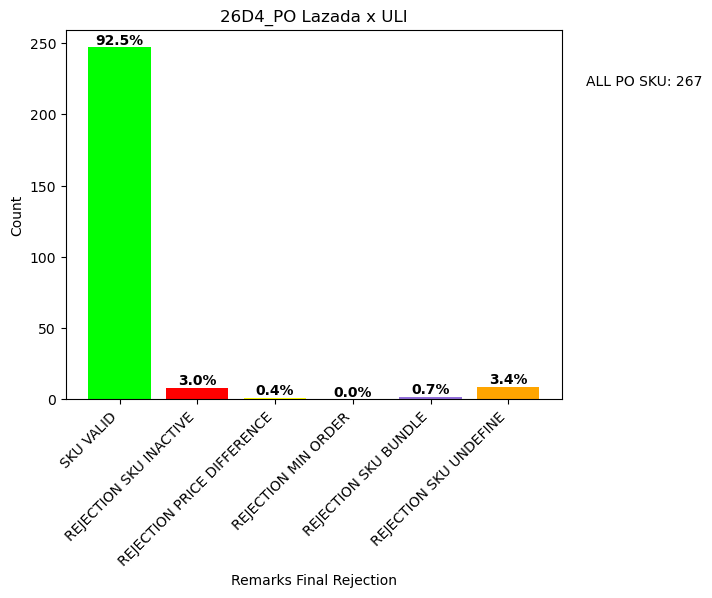

In [352]:
color = ('#00FF00', '#FF0000', 'yellow', '#00BFFF', '#9370DB', '#FFA500')
categories = ('SKU VALID', 'REJECTION SKU INACTIVE', 'REJECTION PRICE DIFFERENCE', 'REJECTION MIN ORDER', 'REJECTION SKU BUNDLE', 'REJECTION SKU UNDEFINE')
data_chart = [submit_sku, rejection_SKUinactive, rejection_Pricediff, rejectionMinorder, rejectionBundle, rejectionUndefine]

plt.bar(categories, data_chart, color=color)
plt.title('26D4_PO Lazada x ULI')

total_all_po_sku = len(df)
plt.text(6, 220, f"ALL PO SKU: {jumlah_all_po_sku}", fontsize=10, ha='left')

for i, v in enumerate(data_chart):
    percentage = (v / total_all_po_sku) * 100
    plt.text(i, v + 10, f"{percentage:.1f}%", ha='center', va='top', fontweight='bold', color='black')

plt.xticks(rotation=45, ha='right')
plt.xlabel('Remarks Final Rejection')
plt.ylabel('Count')


plt.savefig('26D4_barChart.png', bbox_inches='tight')
plt.show()


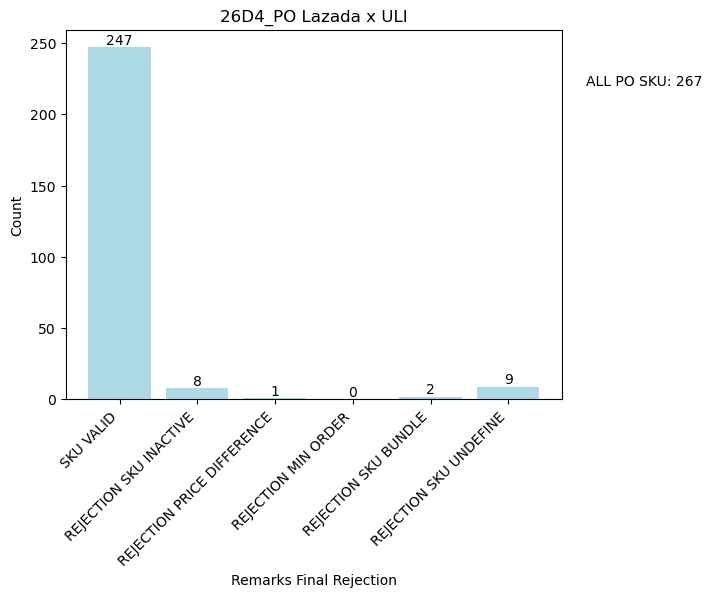

In [334]:
data_chart = [submit_sku, rejection_SKUinactive, rejection_Pricediff, rejectionMinorder, rejectionBundle, rejectionUndefine]

color = 'lightblue'

categories = ['SKU VALID', 'REJECTION SKU INACTIVE', 'REJECTION PRICE DIFFERENCE', 'REJECTION MIN ORDER', 'REJECTION SKU BUNDLE', 'REJECTION SKU UNDEFINE']

plt.bar(categories, data_chart, color=color)
plt.title('26D4_PO Lazada x ULI')

jumlah_all_po_sku = len(df)
plt.text(6, 220, f"ALL PO SKU: {jumlah_all_po_sku}", fontsize=10, ha='left')

for i, v in enumerate(data_chart):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.xticks(rotation=45, ha='right')
plt.xlabel('Remarks Final Rejection')
plt.ylabel('Count')

plt.savefig('26D4_barChart.png', bbox_inches='tight')
plt.show()


In [281]:
#save chart ke sheet -> done

In [282]:
#bar chart copy to excel
workbook = openpyxl.load_workbook('26D4_Final PO Lazada - ULI.xlsx')
sheet_all_po_sku = workbook['ALL PO SKU']
img = openpyxl.drawing.image.Image('26D4_barChart.png')
img.anchor = sheet_all_po_sku.cell(row=5, column=sheet_all_po_sku.max_column + 4).coordinate
sheet_all_po_sku.add_image(img)

workbook.save('26D4_Final PO Lazada - ULI.xlsx')

In [283]:
#SPIKE ORDER ANALYSIS

In [284]:
file_processing = 'PO Lazada x ULI Template Processing.xlsx'

In [285]:
df = pd.read_excel(file_processing, sheet_name='proses')

In [286]:
selected_orderCols = ['unicode', 'Purchase Order Number', 'PC Code', 'SKU Description', 'PLANT', 'Final Order Qty (pcs)', 'Isi per Karton (UOM)', 'Konversi ke Karton', 'RDD', 'Available PC CODE', 'QI Stock PC CODE', 'IT This wk PC CODE', 'IT Next wk PC CODE', 'RR_SO 13WK PC CODE', 'RR_ACT 13 WK PC CODE', 'RR_SO 5WK PC CODE', 'RR_ACT 5WK PC CODE']
spikeOrder = df[selected_orderCols]

In [287]:
spikeOrder.head() #Sheet spike order

,unicode,Purchase Order Number,PC Code,SKU Description,PLANT,Final Order Qty (pcs),Isi per Karton (UOM),Konversi ke Karton,RDD,Available PC CODE,QI Stock PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE
0,688848039150,IDP0762733,68884803,LUX BW MAGICAL ORCHID LD REFF 12X825ML,9150,120,12.0,10.0,24/07/2023,5630.0,0.0,0.0,0.0,1092.538462,1091.692308,1163.0,1162.6
1,679439289150,IDP0762733,67943928,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,9150,156,12.0,13.0,24/07/2023,1501.0,0.0,0.0,288.0,399.307692,383.846154,456.0,432.0
2,678838009150,IDP0762733,67883800,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,9150,96,24.0,4.0,24/07/2023,1098.0,0.0,0.0,0.0,540.461538,528.076923,760.8,739.8
3,688183839150,IDP0762733,68818383,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,9150,1332,12.0,111.0,24/07/2023,6319.0,3636.0,0.0,0.0,775.615385,584.923077,767.0,762.8
4,681877269150,IDP0762733,68187726,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,9150,192,12.0,16.0,24/07/2023,0.0,0.0,0.0,0.0,225.000000,210.307692,304.6,251.8


In [288]:
spikeOrder.dtypes

unicode                   object
Purchase Order Number     object
PC Code                   object
SKU Description           object
PLANT                      int64
Final Order Qty (pcs)      int64
Isi per Karton (UOM)     float64
Konversi ke Karton       float64
RDD                       object
Available PC CODE        float64
QI Stock PC CODE         float64
IT This wk PC CODE       float64
IT Next wk PC CODE       float64
RR_SO 13WK PC CODE       float64
RR_ACT 13 WK PC CODE     float64
RR_SO 5WK PC CODE        float64
RR_ACT 5WK PC CODE       float64
dtype: object

In [289]:
#function Remarks Spike Order

In [290]:
spikeOrder = spikeOrder.rename(columns={'Konversi ke Karton': 'Final Order Qty (Cs)'})

In [291]:
spikeOrder['Remarks by RR_SO 13WK'] = spikeOrder.apply(lambda row: 'ORDER SPIKE' if row['Final Order Qty (Cs)'] >= row['RR_SO 13WK PC CODE'] else 'ORDER NORMAL', axis=1)

In [292]:
spikeOrder.head()

,unicode,Purchase Order Number,PC Code,SKU Description,PLANT,Final Order Qty (pcs),Isi per Karton (UOM),Final Order Qty (Cs),RDD,Available PC CODE,QI Stock PC CODE,IT This wk PC CODE,IT Next wk PC CODE,RR_SO 13WK PC CODE,RR_ACT 13 WK PC CODE,RR_SO 5WK PC CODE,RR_ACT 5WK PC CODE,Remarks by RR_SO 13WK
0,688848039150,IDP0762733,68884803,LUX BW MAGICAL ORCHID LD REFF 12X825ML,9150,120,12.0,10.0,24/07/2023,5630.0,0.0,0.0,0.0,1092.538462,1091.692308,1163.0,1162.6,ORDER NORMAL
1,679439289150,IDP0762733,67943928,ZWITSAL BB SHP NAT AVKS PCH LD 12X250ML,9150,156,12.0,13.0,24/07/2023,1501.0,0.0,0.0,288.0,399.307692,383.846154,456.0,432.0,ORDER NORMAL
2,678838009150,IDP0762733,67883800,ZWITSAL KIDS SHP PINK SOFT&MSTR 4X6180ML,9150,96,24.0,4.0,24/07/2023,1098.0,0.0,0.0,0.0,540.461538,528.076923,760.8,739.8,ORDER NORMAL
3,688183839150,IDP0762733,68818383,VASELINE HB GLU SER BUR UV LOT 4X3X330ML,9150,1332,12.0,111.0,24/07/2023,6319.0,3636.0,0.0,0.0,775.615385,584.923077,767.0,762.8,ORDER NORMAL
4,681877269150,IDP0762733,68187726,VASELINE HB FIRM GLOW SRM PJ 4X3X180ML,9150,192,12.0,16.0,24/07/2023,0.0,0.0,0.0,0.0,225.000000,210.307692,304.6,251.8,ORDER NORMAL


In [293]:
spikeOrder.to_excel('26D4_Lazada Spike Order Report.xlsx', sheet_name='Result', index=False)

In [294]:
FileLink('PO Lazada x ULI Template Processing.xlsx')

C:\Users\Kelvin-Kurniawan.ULI\Kelvin_Project\PO Lazada x ULI\PO Lazada x ULI Template Processing.xlsx

In [295]:
FileLink('26D4_Final PO Lazada - ULI.xlsx')

C:\Users\Kelvin-Kurniawan.ULI\Kelvin_Project\PO Lazada x ULI\26D4_Final PO Lazada - ULI.xlsx

In [296]:
FileLink('26D4_Lazada Spike Order Report.xlsx')

C:\Users\Kelvin-Kurniawan.ULI\Kelvin_Project\PO Lazada x ULI\26D4_Lazada Spike Order Report.xlsx